# 2019 Portuguese legislative election
The Portuguese legislative election of 2019 was held on 6 October 2019,for all 230 seats.
27 parties are involve in this electoral event. Here we have a dataset from there for predicting the : final number of elected MP's in a district/national-level. We know that if  some candidate wants to be win on election then he/she should be elect by the public. And Here Vote is the most important think. From the data  set we got the info that Number of MP's according to the distribution of votes now, Percentage of party votes and Percentage of valid votes in a party are the most important to getting the good numbers of majority on a  district/National-level. When the more peoples are going for giving the vote and they are aware about this ,then only a good leader will be make the majority. When the votes percentage will be increase, then only the better result will be come. Here we have  to predict the number of elected MP's in a district/national-level.
Here we’ll do some kind of EDA ,Data visualization, Encoding, Feature Selection,Spliting,Standadize, Finally we are going to predict the number of elected MP's in a district/national-level with the Regressor model .
Thankyou


In [1]:
#imporint the necessary libary
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
#loading the dataset
df_elc=pd.read_csv("D:/ElectionData.csv")

# Attribute Information:

TimeElapsed (Numeric): Time (minutes) passed since the first data acquisition

time (timestamp): Date and time of the data acquisition

territoryName (string): Short name of the location (district or nation-wide)


totalMandates (numeric): MP's elected at the moment

availableMandates (numeric): MP's left to elect at the moment

numParishes (numeric): Total number of parishes in this location

numParishesApproved (numeric): Number of parishes approved in this location

blankVotes (numeric): Number of blank votes

blankVotesPercentage (numeric): Percentage of blank votes

nullVotes (numeric): Number of null votes

nullVotesPercentage (numeric): Percentage of null votes

votersPercentage (numeric): Percentage of voters

subscribedVoters (numeric): Number of subscribed voters in the location

totalVoters (numeric): Percentage of blank votes

pre.blankVotes (numeric): Number of blank votes (previous election)

pre.blankVotesPercentage (numeric): Percentage of blank votes (previous election)

pre.nullVotes (numeric): Number of null votes (previous election)

pre.nullVotesPercentage (numeric): Percentage of null votes (previous election)

pre.votersPercentage (numeric): Percentage of voters (previous election)

pre.subscribedVoters (numeric): Number of subscribed voters in the location (previous election)

pre.totalVoters (numeric): Percentage of blank votes (previous election)

Party (string): Political Party

Mandates (numeric): MP's elected at the moment for the party in a given district

Percentage (numeric): Percentage of votes in a party

validVotesPercentage (numeric): Percentage of valid votes in a party

Votes (numeric): Percentage of party votes

Hondt (numeric): Number of MP's according to the distribution of votes now

FinalMandates (numeric): final number of elected MP's in a district/national-level



In [3]:
df_elc.head()

,TimeElapsed,time,territoryName,totalMandates,availableMandates,numParishes,numParishesApproved,blankVotes,blankVotesPercentage,nullVotes,...,pre.votersPercentage,pre.subscribedVoters,pre.totalVoters,Party,Mandates,Percentage,validVotesPercentage,Votes,Hondt,FinalMandates
0,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,PS,0,38.29,40.22,147993,94,106
1,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,PPD/PSD,0,33.28,34.95,128624,81,77
2,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,B.E.,0,6.81,7.15,26307,16,19
3,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,CDS-PP,0,4.90,5.14,18923,12,5
4,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,PCP-PEV,0,4.59,4.83,17757,11,12


In [4]:
#cheking the columns
df_elc.columns

Index(['TimeElapsed', 'time', 'territoryName', 'totalMandates',
       'availableMandates', 'numParishes', 'numParishesApproved', 'blankVotes',
       'blankVotesPercentage', 'nullVotes', 'nullVotesPercentage',
       'votersPercentage', 'subscribedVoters', 'totalVoters', 'pre.blankVotes',
       'pre.blankVotesPercentage', 'pre.nullVotes', 'pre.nullVotesPercentage',
       'pre.votersPercentage', 'pre.subscribedVoters', 'pre.totalVoters',
       'Party', 'Mandates', 'Percentage', 'validVotesPercentage', 'Votes',
       'Hondt', 'FinalMandates'],
      dtype='object')

In [5]:
#checking the dtypes of the dataset
df_elc.dtypes

TimeElapsed                   int64
time                         object
territoryName                object
totalMandates                 int64
availableMandates             int64
numParishes                   int64
numParishesApproved           int64
blankVotes                    int64
blankVotesPercentage        float64
nullVotes                     int64
nullVotesPercentage         float64
votersPercentage            float64
subscribedVoters              int64
totalVoters                   int64
pre.blankVotes                int64
pre.blankVotesPercentage    float64
pre.nullVotes                 int64
pre.nullVotesPercentage     float64
pre.votersPercentage        float64
pre.subscribedVoters          int64
pre.totalVoters               int64
Party                        object
Mandates                      int64
Percentage                  float64
validVotesPercentage        float64
Votes                         int64
Hondt                         int64
FinalMandates               

Observation:
    
    Here we have 2 types of data objective and numeric.
    
    Numeric  dtypes belongs to float and int.

In [6]:
#checking the shape
df_elc.shape

(21643, 28)

In this dataset we have 21643 rows and 28 columns


In [7]:
#checking informantion about dataset
df_elc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21643 entries, 0 to 21642
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   TimeElapsed               21643 non-null  int64  
 1   time                      21643 non-null  object 
 2   territoryName             21643 non-null  object 
 3   totalMandates             21643 non-null  int64  
 4   availableMandates         21643 non-null  int64  
 5   numParishes               21643 non-null  int64  
 6   numParishesApproved       21643 non-null  int64  
 7   blankVotes                21643 non-null  int64  
 8   blankVotesPercentage      21643 non-null  float64
 9   nullVotes                 21643 non-null  int64  
 10  nullVotesPercentage       21643 non-null  float64
 11  votersPercentage          21643 non-null  float64
 12  subscribedVoters          21643 non-null  int64  
 13  totalVoters               21643 non-null  int64  
 14  pre.bl

In [8]:
df_elc.dtypes

TimeElapsed                   int64
time                         object
territoryName                object
totalMandates                 int64
availableMandates             int64
numParishes                   int64
numParishesApproved           int64
blankVotes                    int64
blankVotesPercentage        float64
nullVotes                     int64
nullVotesPercentage         float64
votersPercentage            float64
subscribedVoters              int64
totalVoters                   int64
pre.blankVotes                int64
pre.blankVotesPercentage    float64
pre.nullVotes                 int64
pre.nullVotesPercentage     float64
pre.votersPercentage        float64
pre.subscribedVoters          int64
pre.totalVoters               int64
Party                        object
Mandates                      int64
Percentage                  float64
validVotesPercentage        float64
Votes                         int64
Hondt                         int64
FinalMandates               

In [9]:
#droping useless columns
df_elc.drop('time',axis=1,inplace=True)
df_elc.drop('TimeElapsed',axis=1,inplace=True)

In [10]:
#checking the null values
df_elc.isnull().values.any()

False

Itmeans there is no missing value inside the dataset

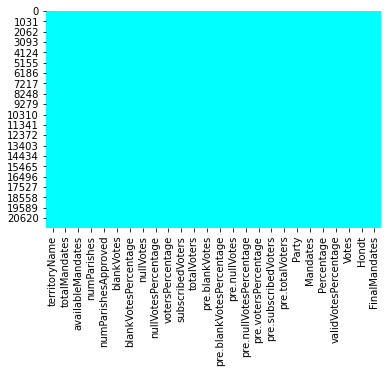

In [11]:
#lets cofirm with heatmap
sns.heatmap(df_elc.isnull(),cbar=False,cmap="cool")

we can see here also there is no Missing values are present in side the data set

In [12]:
#value counts of objectives data
c=df_elc.columns
for i in c:
    if df_elc[i].dtypes=='object':
        print(df_elc[i].value_counts())
        print("♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣")

Leiria                 1134
Território Nacional    1134
Porto                  1134
Braga                  1134
Coimbra                1080
Viseu                  1080
Viana do Castelo       1080
Aveiro                 1080
Madeira                1080
Lisboa                 1080
Setúbal                1080
Faro                   1026
Santarém               1026
Évora                  1026
Guarda                 1026
Bragança                972
Castelo Branco          972
Beja                    918
Portalegre              918
Vila Real               864
Açores                  799
Name: territoryName, dtype: int64
♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
PDR          1127
PCTP/MRPP    1127
CDS-PP       1127
IL           1127
PPD/PSD      1127
CH           1127
PS           1127
PCP-PEV      1127
A            1127
L            1127
B.E.         1127
PAN          1127
PNR          1127
PPM          1073
R.I.R.       1026
PTP          1019
MPT          1019
N

# Statistic Summary


In [13]:
df_elc.describe()


,totalMandates,availableMandates,numParishes,numParishesApproved,blankVotes,blankVotesPercentage,nullVotes,nullVotesPercentage,votersPercentage,subscribedVoters,...,pre.nullVotesPercentage,pre.votersPercentage,pre.subscribedVoters,pre.totalVoters,Mandates,Percentage,validVotesPercentage,Votes,Hondt,FinalMandates
count,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,2.164300e+04,...,21643.000000,21643.000000,2.164300e+04,2.164300e+04,21643.000000,21643.000000,21643.000000,2.164300e+04,21643.000000,21643.000000
mean,11.544795,11.499284,309.956013,261.090237,8875.066673,2.621629,6148.068752,1.961471,51.983722,6.275367e+05,...,1.777442,54.549372,6.378503e+05,3.594932e+05,0.565495,4.968484,5.207232,1.585209e+04,1.126138,1.126138
std,31.314567,31.738783,659.055911,583.377428,21484.874088,0.795289,14735.469269,0.375250,4.854380,1.525590e+06,...,0.388798,4.964948,1.544418e+06,8.763729e+05,4.421804,10.379967,10.881108,9.310605e+04,6.293552,6.872644
min,0.000000,0.000000,54.000000,3.000000,19.000000,0.530000,39.000000,1.340000,35.980000,5.767000e+03,...,1.140000,40.870000,6.383000e+03,3.215000e+03,0.000000,0.020000,0.020000,1.000000e+00,0.000000,0.000000
25%,1.000000,0.000000,75.000000,67.000000,1188.000000,2.230000,1094.000000,1.720000,50.290000,1.229870e+05,...,1.520000,51.210000,1.289260e+05,6.964400e+04,0.000000,0.220000,0.230000,2.360000e+02,0.000000,0.000000
50%,4.000000,3.000000,147.000000,120.000000,2998.000000,2.640000,2232.000000,1.870000,53.130000,2.289540e+05,...,1.690000,56.260000,2.284970e+05,1.102730e+05,0.000000,0.620000,0.650000,7.900000e+02,0.000000,0.000000
75%,9.000000,9.000000,242.000000,208.000000,6889.000000,2.980000,4121.000000,2.230000,54.550000,3.804890e+05,...,1.970000,58.220000,3.933140e+05,2.276200e+05,0.000000,3.010000,3.160000,4.510000e+03,0.000000,0.000000
max,226.000000,226.000000,3092.000000,3092.000000,129599.000000,5.460000,88539.000000,3.350000,59.870000,9.343084e+06,...,3.120000,62.580000,9.439701e+06,5.380451e+06,106.000000,49.110000,51.420000,1.866407e+06,94.000000,106.000000


Observation:
    
    1.Minimum of numParishes is 54 and maximum is 3092.
    
    2.Minimum of numParishesApproved  is 3 and maximum is 3092
    
    3. Minmum of BlankVotes is 19 and maximum is 129599
    
    4.StandardDeviation is hgigh in blankvotes.
    
    6.There is huge difference between 75 quartile and maximum value in  totalMandates,availableMandates,numParishes,numParishesApproved,
       blankVotes,nullVotes,validVotesPercentage,Hondt and Hondt columns may be outliers are present.
    

# Correlation

In [14]:
df_elc.corr()

,totalMandates,availableMandates,numParishes,numParishesApproved,blankVotes,blankVotesPercentage,nullVotes,nullVotesPercentage,votersPercentage,subscribedVoters,...,pre.nullVotesPercentage,pre.votersPercentage,pre.subscribedVoters,pre.totalVoters,Mandates,Percentage,validVotesPercentage,Votes,Hondt,FinalMandates
totalMandates,1.000000,0.217404,0.765877,0.873415,0.969988,-0.003149,0.967294,-0.165132,0.171317,0.974407,...,-0.132143,0.151927,0.972976,0.975404,0.336989,-0.010171,-0.010474,0.395617,0.288420,0.264117
availableMandates,0.217404,1.000000,0.745472,0.562719,0.390638,-0.002806,0.407366,0.029915,0.112293,0.385828,...,-0.044174,0.080524,0.391272,0.383089,0.072320,-0.011083,-0.011052,0.152348,0.291310,0.266764
numParishes,0.765877,0.745472,1.000000,0.954092,0.861279,0.032013,0.870240,0.013209,0.073855,0.856855,...,-0.058017,0.026407,0.860782,0.853779,0.257365,-0.010770,-0.010624,0.343593,0.359283,0.329009
numParishesApproved,0.873415,0.562719,0.954092,1.000000,0.951265,0.035153,0.956142,-0.037416,0.081157,0.946191,...,-0.073301,0.042180,0.949110,0.943147,0.293795,-0.009840,-0.009767,0.380311,0.340901,0.312177
blankVotes,0.969988,0.390638,0.861279,0.951265,1.000000,0.038503,0.998781,-0.150894,0.183970,0.998297,...,-0.150275,0.161642,0.998487,0.998178,0.326630,-0.011883,-0.012002,0.404003,0.322780,0.295583
blankVotesPercentage,-0.003149,-0.002806,0.032013,0.035153,0.038503,1.000000,0.006615,0.094047,-0.190778,0.001598,...,-0.307544,-0.105314,0.002821,-0.000069,-0.000926,-0.006258,-0.002076,-0.001486,-0.001305,-0.001195
nullVotes,0.967294,0.407366,0.870240,0.956142,0.998781,0.006615,1.000000,-0.136296,0.181411,0.998988,...,-0.125639,0.154965,0.999296,0.998706,0.325711,-0.011602,-0.011820,0.404195,0.326144,0.298663
nullVotesPercentage,-0.165132,0.029915,0.013209,-0.037416,-0.150894,0.094047,-0.136296,1.000000,-0.108855,-0.157263,...,0.497749,-0.233688,-0.153891,-0.159566,-0.056254,0.003301,0.005441,-0.066526,-0.032388,-0.029659
votersPercentage,0.171317,0.112293,0.073855,0.081157,0.183970,-0.190778,0.181411,-0.108855,1.000000,0.173603,...,-0.278275,0.909825,0.172542,0.186834,0.056553,-0.019836,-0.020966,0.076377,0.066665,0.061048
subscribedVoters,0.974407,0.385828,0.856855,0.946191,0.998297,0.001598,0.998988,-0.157263,0.173603,1.000000,...,-0.133139,0.152401,0.999954,0.999841,0.328197,-0.011276,-0.011548,0.404861,0.322750,0.295555


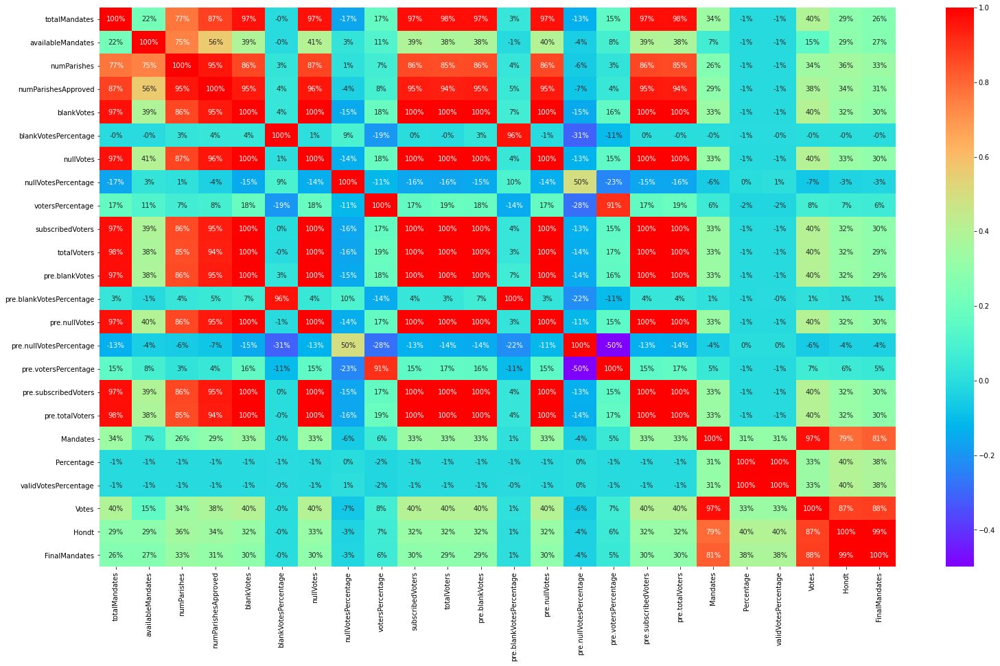

In [15]:
#lets plot the correlation with heat map()
plt.figure(figsize=[26,15])
sns.heatmap(df_elc.corr(),annot=True,fmt='.0%',cmap='rainbow')

Observation:
    
    Mandates,Votes and Hondt are highly correlated with FinalMandates.
    
    pre.nullVotes,nullVotesPercentage,blankVotesPercentage are -vely correlated with FinalMandates

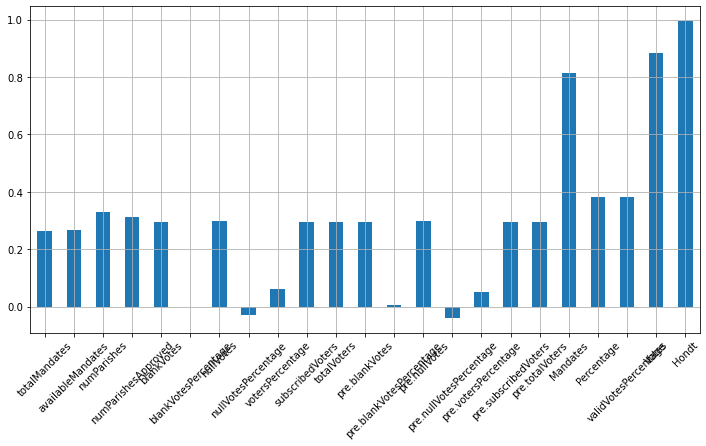

In [16]:
#correlation with target 
plt.figure(figsize=[12,6])
df_elc.drop('FinalMandates',axis=1).corrwith(df_elc['FinalMandates']).plot(kind='bar',grid=True)
plt.xticks(rotation=45)
plt.show()

# outliers

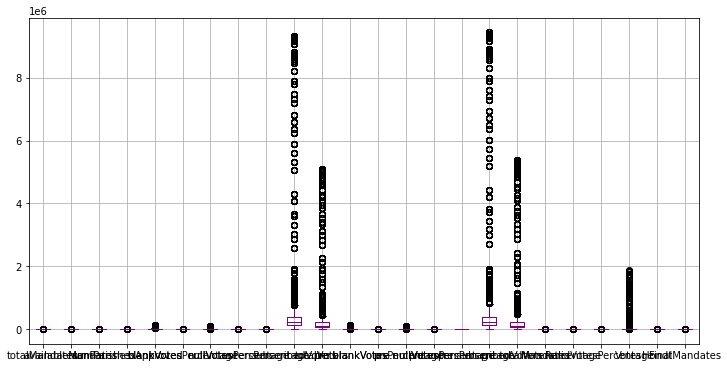

In [17]:
plt.figure(figsize=[12,6])
df_elc.boxplot(color='purple')

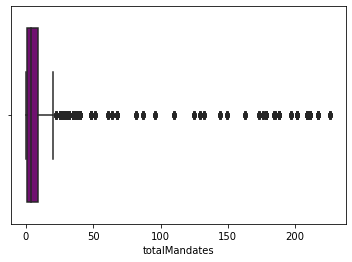

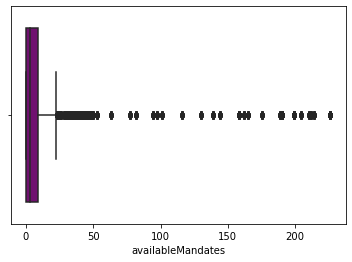

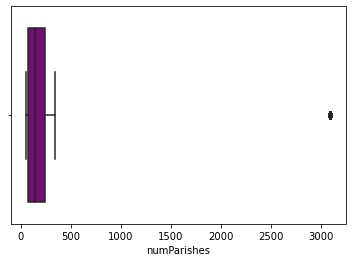

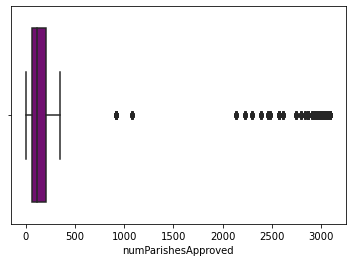

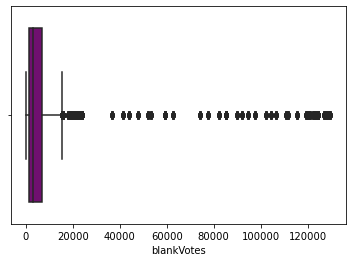

...

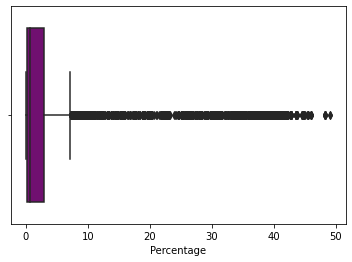

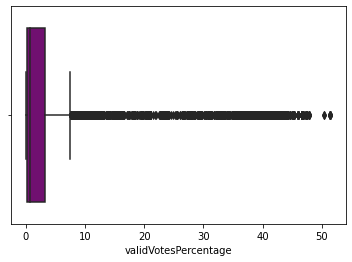

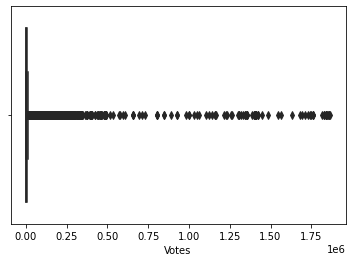

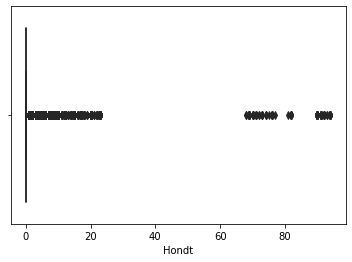

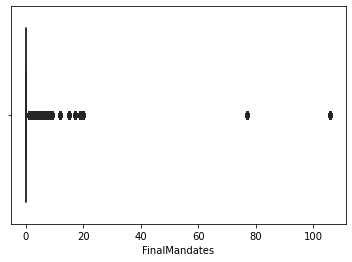

In [18]:
d=df_elc.columns
for i in d:
    if df_elc[i].dtypes!='object':
            sns.boxplot(df_elc[i],color='purple')
            plt.show()

Observation:
    
    We have outliers in all int type columns except TimeElased.

# Skewness

In [19]:
#checking the skewness of data set
df_elc.skew()

totalMandates                5.150031
availableMandates            5.131572
numParishes                  3.920433
numParishesApproved          4.238343
blankVotes                   4.521940
blankVotesPercentage         0.069627
nullVotes                    4.520945
nullVotesPercentage          0.855419
votersPercentage            -1.158029
subscribedVoters             4.568797
totalVoters                  4.541364
pre.blankVotes               4.551489
pre.blankVotesPercentage     0.021609
pre.nullVotes                4.563235
pre.nullVotesPercentage      1.231109
pre.votersPercentage        -0.779289
pre.subscribedVoters         4.565085
pre.totalVoters              4.548030
Mandates                    16.576658
Percentage                   2.542328
validVotesPercentage         2.543122
Votes                       13.940573
Hondt                       11.489315
FinalMandates               12.402865
dtype: float64

Observation:
    
    Votes,Hondt,FinalMandates and Mandates columns we have high skewed data.
    
    

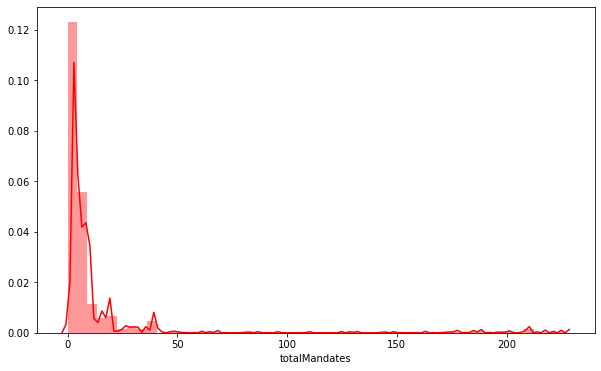

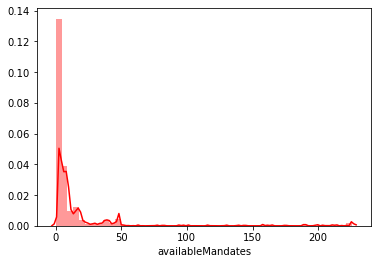

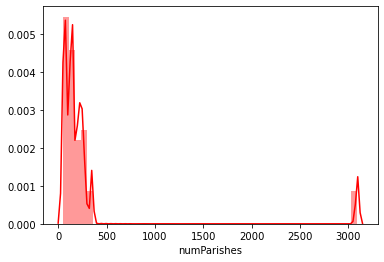

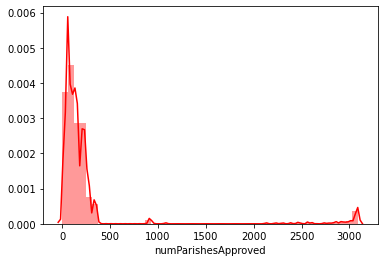

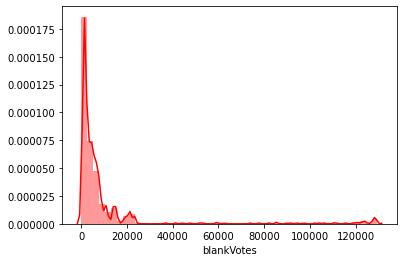

...

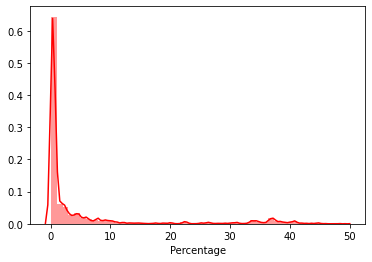

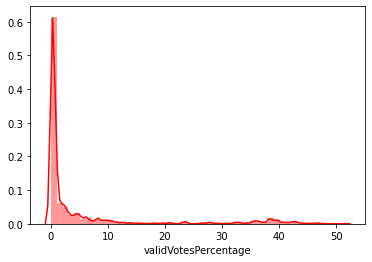

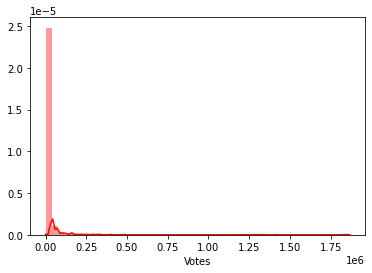

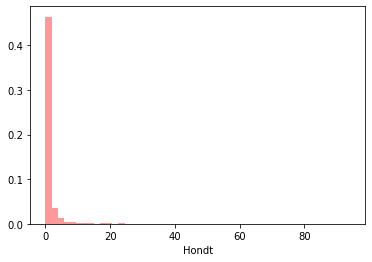

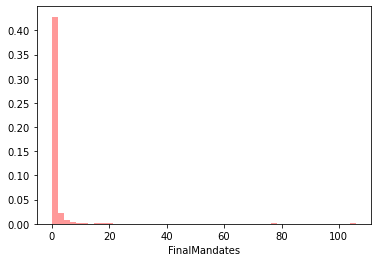

In [20]:
d=df_elc.columns
plt.figure(figsize=[10,6])
for i in d:
    if df_elc[i].dtypes!='object':
            sns.distplot(df_elc[i],color='red')
            plt.show()

# Univariate Analysis

In [21]:
#lets make a function for countplot and violin plot
def plot(p):
    sns.set_style("whitegrid")
    plt.figure(figsize=[15,5])
    sns.countplot(x=p,data=df_elc,color='darkviolet')
    plt.title(p,{"fontsize":20})
    plt.show()
    sns.violinplot(x=p,data=df_elc,color='red')
    plt.xlabel(p)
    plt.title(p,{"fontsize":20})
    plt.xticks(rotation=90)
    plt.show()
    

In [22]:
#lets make a function for countplot
def plot1(p):
    d=df_elc[p].value_counts()
    sns.set_style("whitegrid")
    plt.figure(figsize=[15,5])
    sns.countplot(x=p,data=df_elc,color='darkviolet')
    plt.xlabel(p)
    plt.title(p,{"fontsize":20})
    plt.xticks(rotation=50)
    plt.show()
    print(d)

In [23]:
#lets amke a function for violinplot
def plot2(p):
    plt.figure(figsize=[15,5])
    sns.violinplot(x=p,data=df_elc,color='darkviolet')
    plt.xlabel(p)
    plt.title(p,{"fontsize":20})
    plt.xticks(rotation=50)
    plt.show()

# territoryName

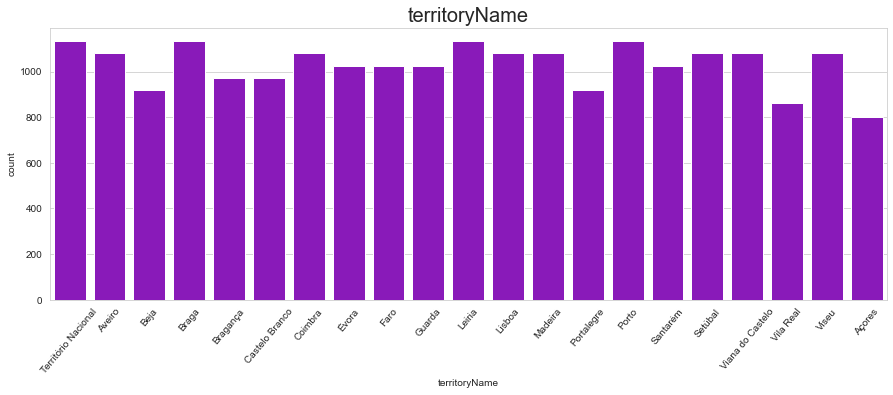

Leiria                 1134
Território Nacional    1134
Porto                  1134
Braga                  1134
Coimbra                1080
Viseu                  1080
Viana do Castelo       1080
Aveiro                 1080
Madeira                1080
Lisboa                 1080
Setúbal                1080
Faro                   1026
Santarém               1026
Évora                  1026
Guarda                 1026
Bragança                972
Castelo Branco          972
Beja                    918
Portalegre              918
Vila Real               864
Açores                  799
Name: territoryName, dtype: int64


In [24]:
plot1("territoryName")

Observation:
    
    Most of the Evalution happen in Leiria,Território Nacional,Porto and Braga  locality.

# totalMandates

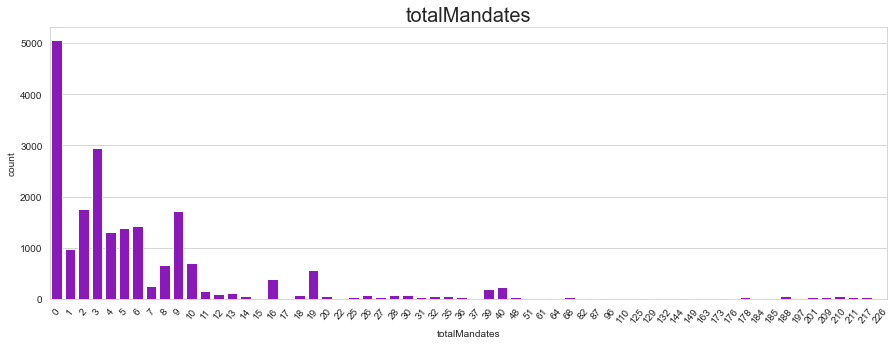

0      5055
3      2949
2      1755
9      1726
6      1419
       ... 
22       21
197      21
149      21
37       21
17       20
Name: totalMandates, Length: 62, dtype: int64


In [25]:
plot1("totalMandates")

Observation:
    1.5055 time no  MP's elected at the moment on a locality.
    
    2.2949 times MP's elected at the moment on a locality.

# availableMandates

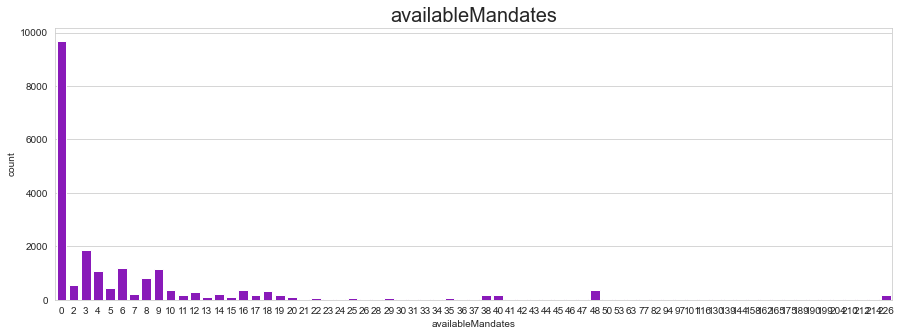

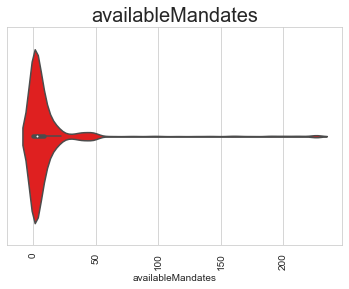

In [26]:
plot("availableMandates")

Observation:
    
    No  MP's left to elect at the momentin a locality.
    

# numParishes

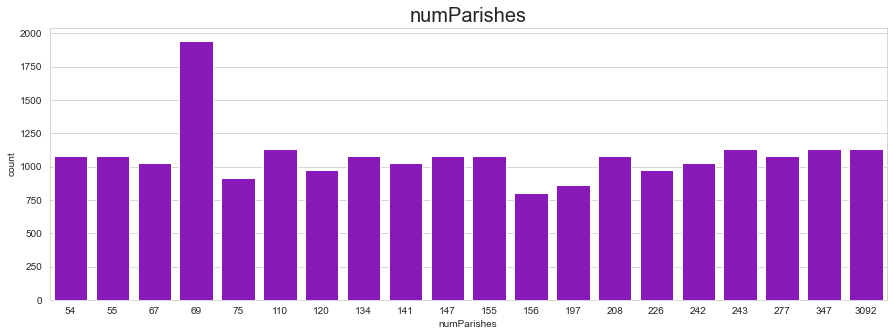

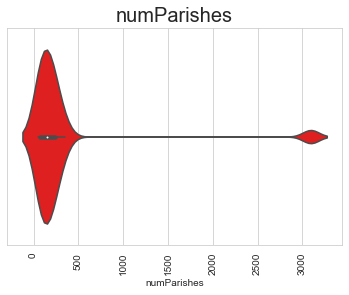

In [27]:
plot("numParishes")

Observation:
    Highest  number of parishes in 69 with nearby 2000 numbers.
    
    lowest number of parishes in 186 with 780 numbers


# numParishesApproved

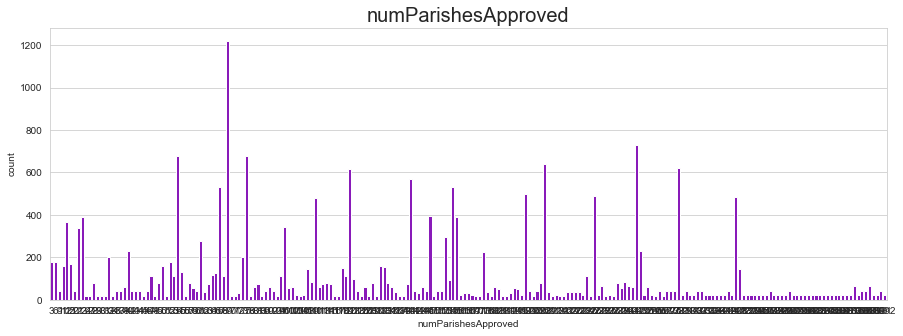

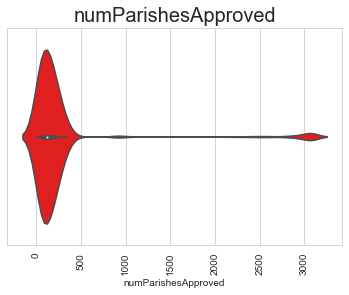

In [28]:
plot("numParishesApproved")

Observation:
    
    Most of the numParishesApproved in ia location is etween 50 to 500

# blankVotes

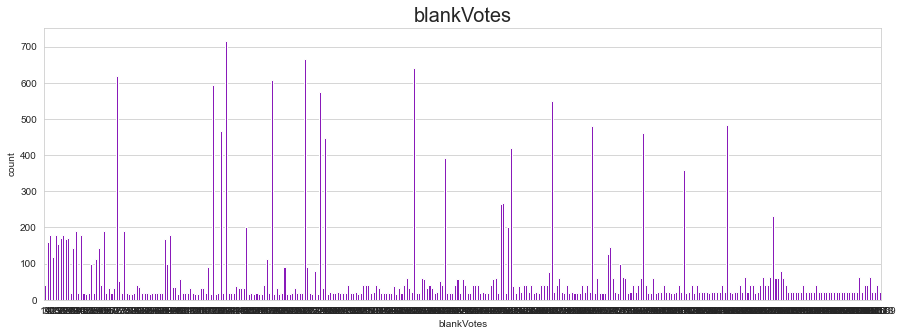

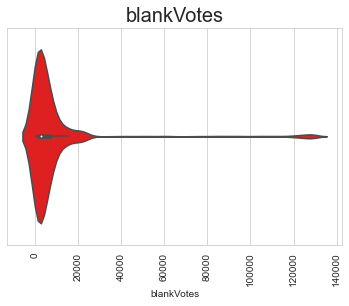

In [29]:
plot("blankVotes")

Observation:
    
    Most of the BalnkVotes are in a location below 700.

# blankVotesPercentage

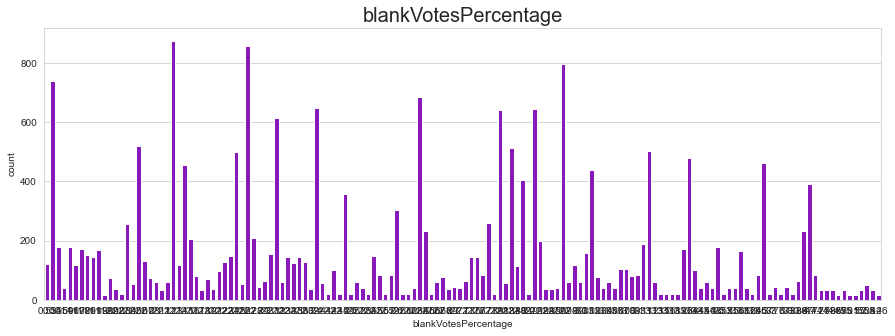

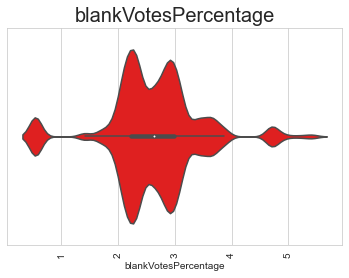

In [30]:
plot("blankVotesPercentage")

Observation:
    
    Most Blank VotePercenge are comming between 2 to 3 in a location.

# nullVotes

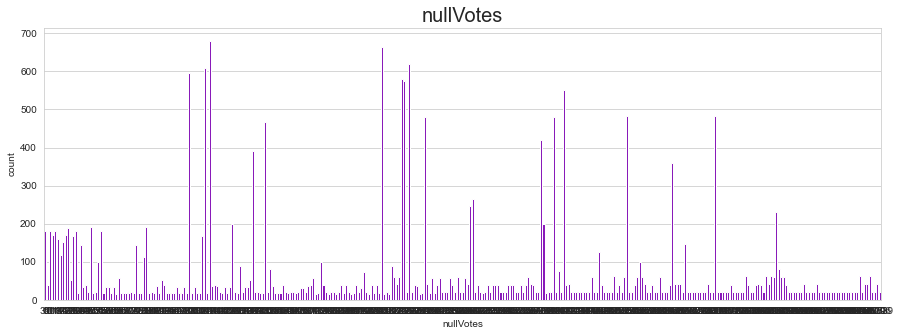

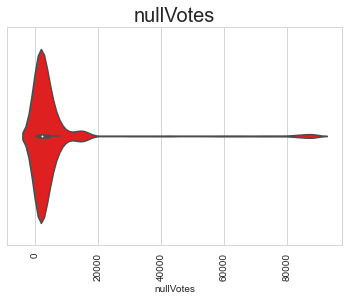

In [31]:
plot("nullVotes")

Observation:
    most Number of null votes is nearby 700 .
    
    min Number of null votes is 39

# nullVotesPercentage

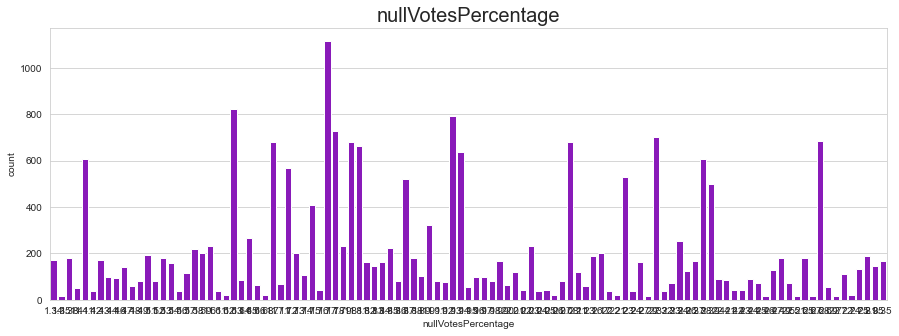

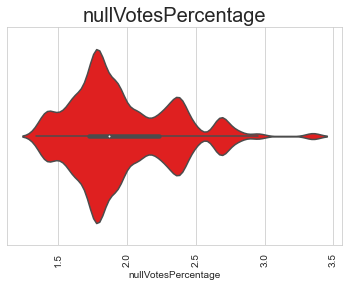

In [32]:
plot("nullVotesPercentage")

Observation:
    
    Most of the Null votespercentage is between 1.7 to 1.8.

# votersPercentage 

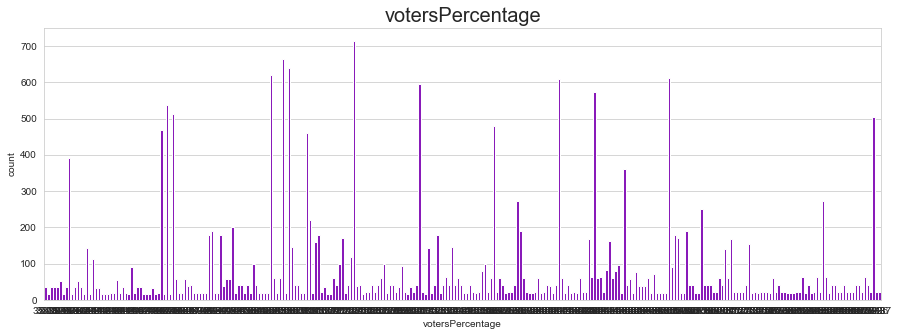

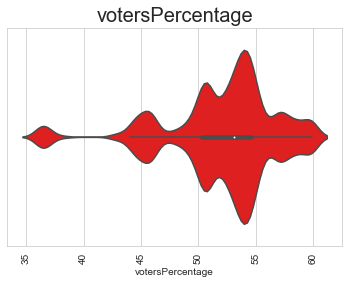

In [33]:
plot("votersPercentage")

Observation:
    
    Most Voterspercentage of a location is 53.
    
    max  Voterspercentage of a location is 60.

# subscribedVoters

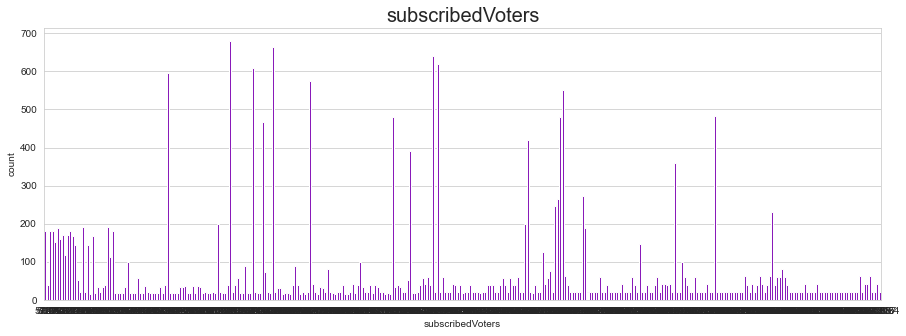

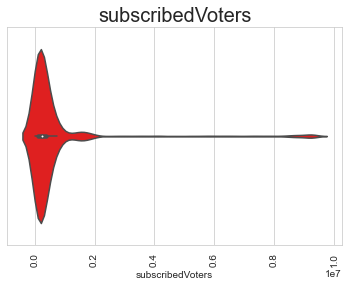

In [34]:
plot("subscribedVoters")

# totalVoters

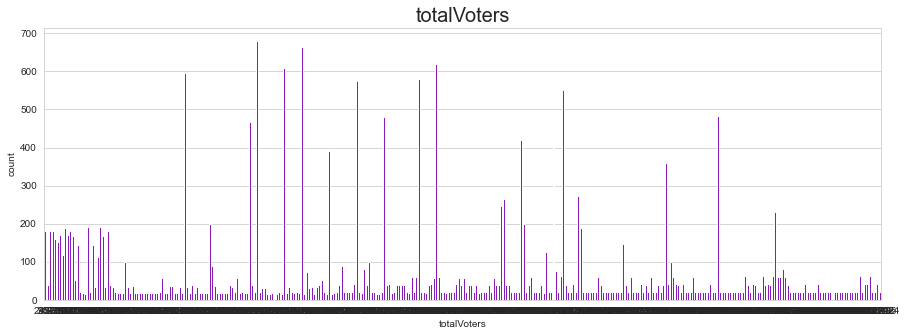

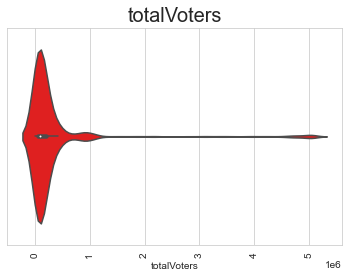

In [35]:
plot("totalVoters")

# pre.blankVotes

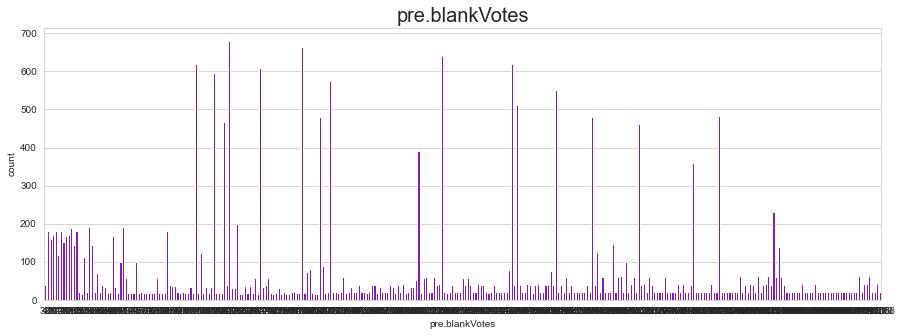

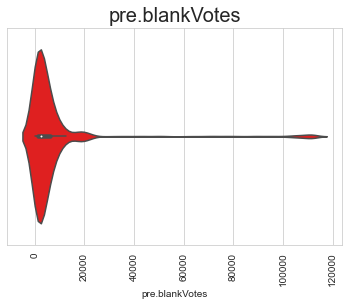

In [36]:
plot("pre.blankVotes")

# pre.blankVotesPercentage

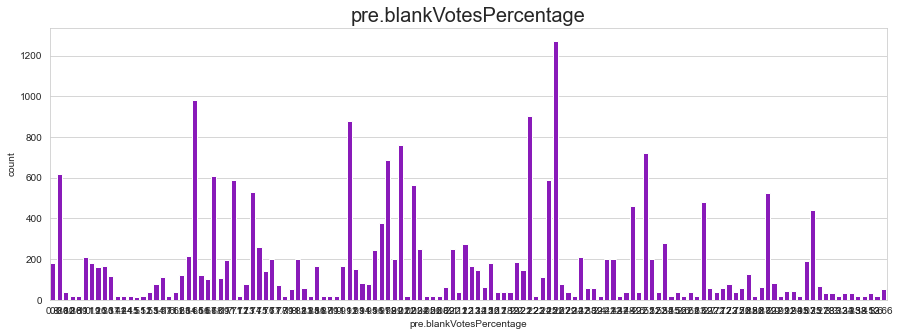

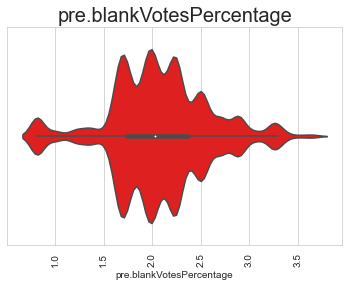

In [37]:
plot("pre.blankVotesPercentage")

# pre.nullVotes

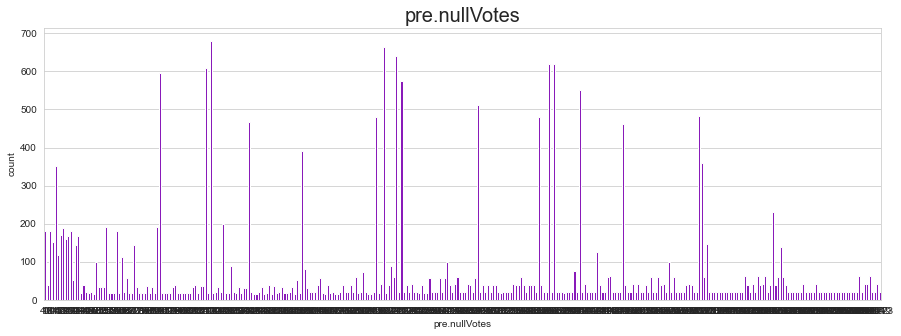

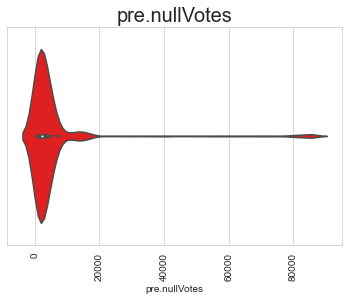

In [38]:
plot("pre.nullVotes")

# pre.nullVotesPercentage

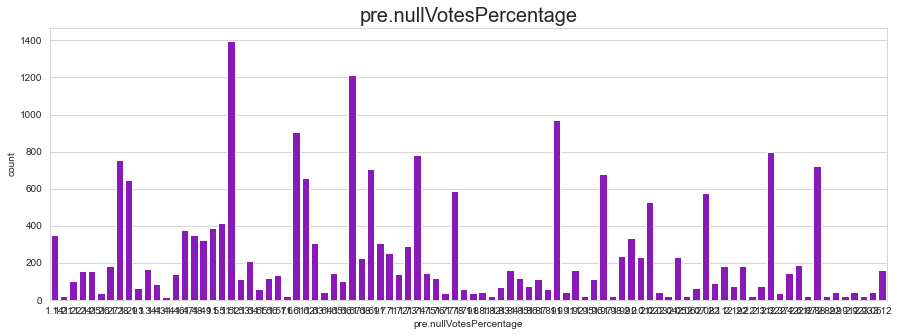

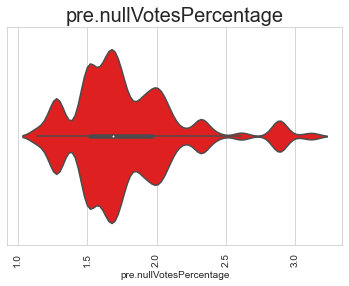

In [39]:
plot("pre.nullVotesPercentage")

# pre.votersPercentage

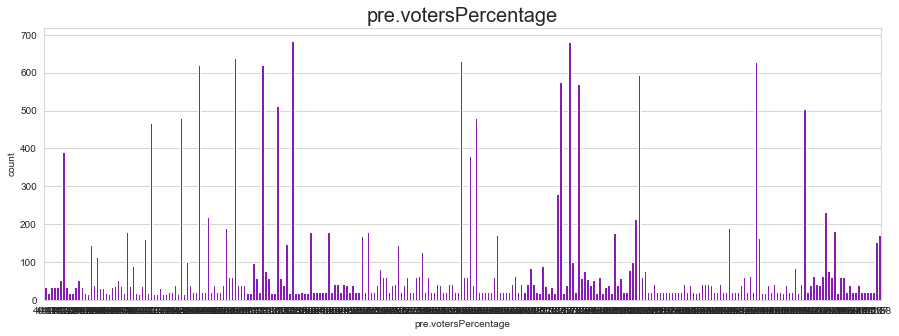

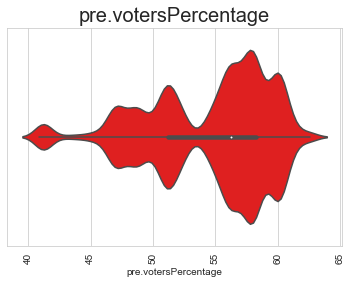

In [40]:
plot("pre.votersPercentage")

# pre.subscribedVoters

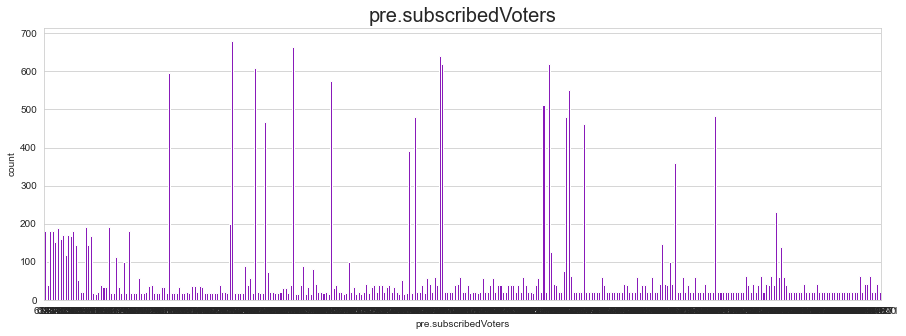

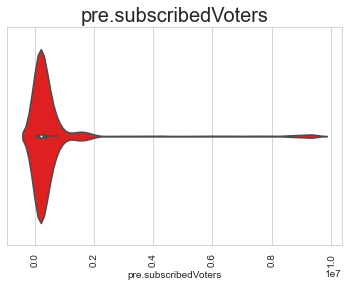

In [41]:
plot("pre.subscribedVoters")

# pre.totalVoters

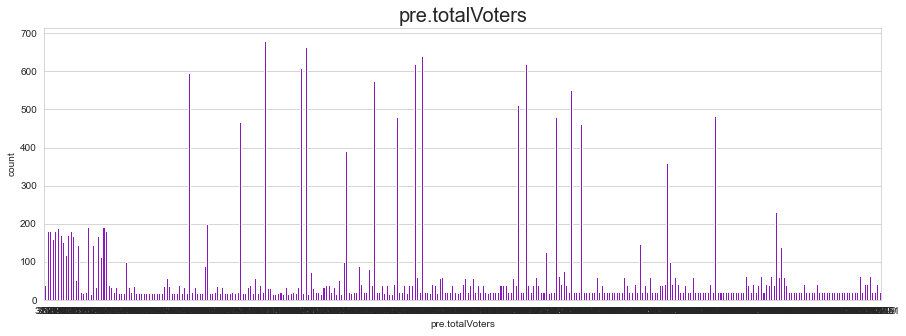

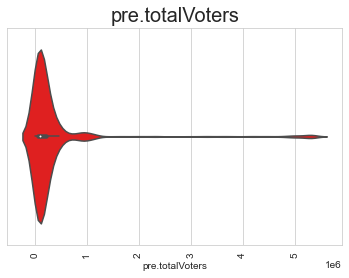

In [42]:
plot("pre.totalVoters")

# Party 

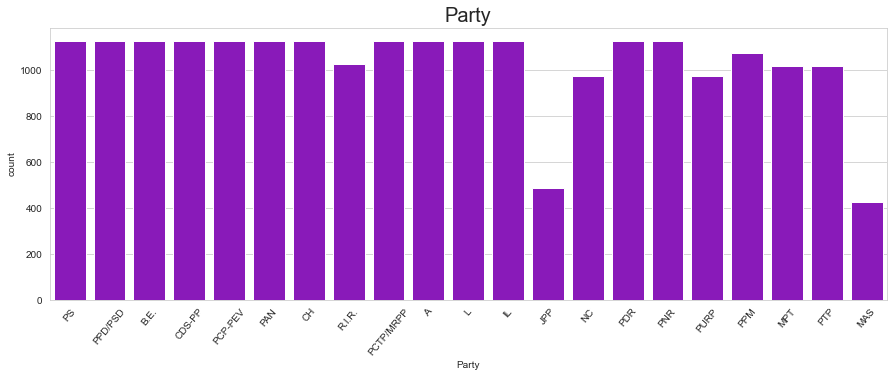

PDR          1127
PCTP/MRPP    1127
CDS-PP       1127
IL           1127
PPD/PSD      1127
CH           1127
PS           1127
PCP-PEV      1127
A            1127
L            1127
B.E.         1127
PAN          1127
PNR          1127
PPM          1073
R.I.R.       1026
PTP          1019
MPT          1019
NC            972
PURP          972
JPP           486
MAS           425
Name: Party, dtype: int64


In [43]:
plot1("Party")

# Mandates

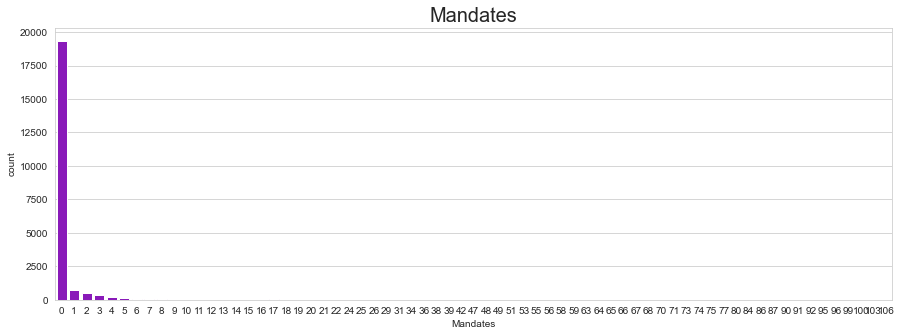

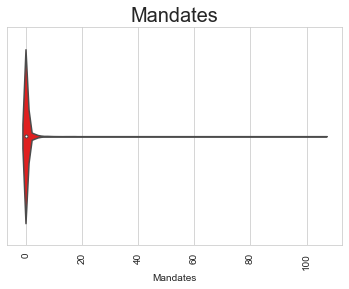

In [44]:
plot("Mandates")

# Percentage 

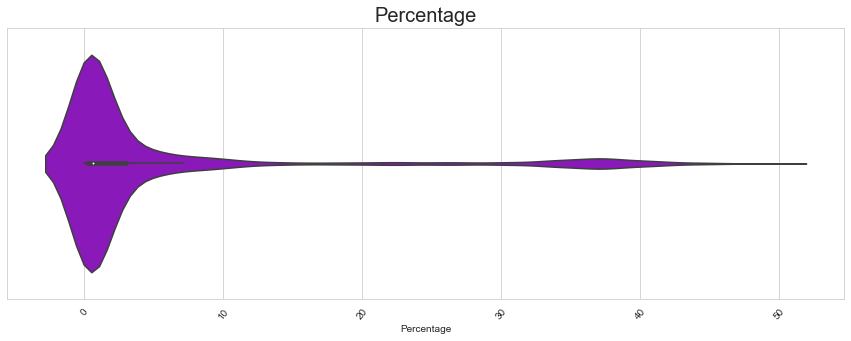

In [45]:
plot2("Percentage")

# validVotesPercentage

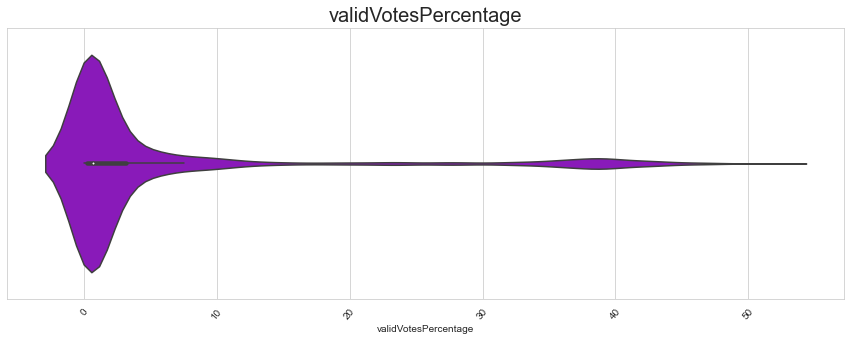

In [46]:
plot2("validVotesPercentage")

# Votes

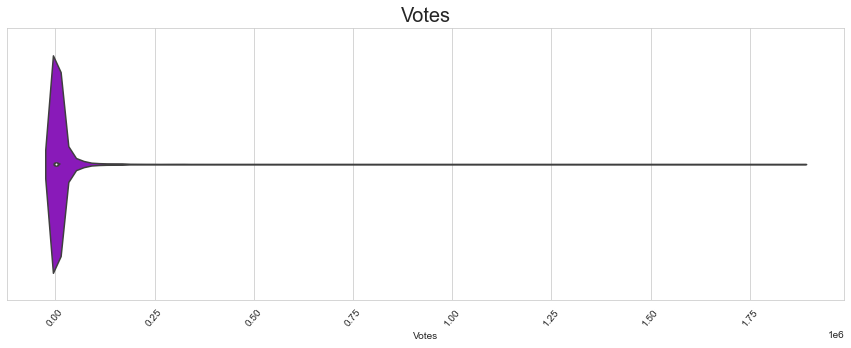

In [47]:
plot2("Votes")

# Hondt

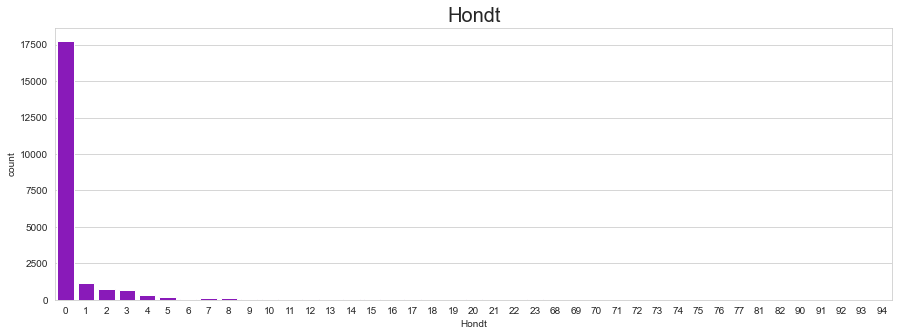

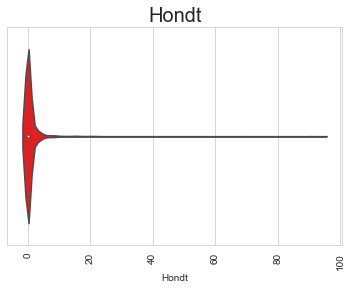

In [48]:
plot("Hondt")

# FinalMandates

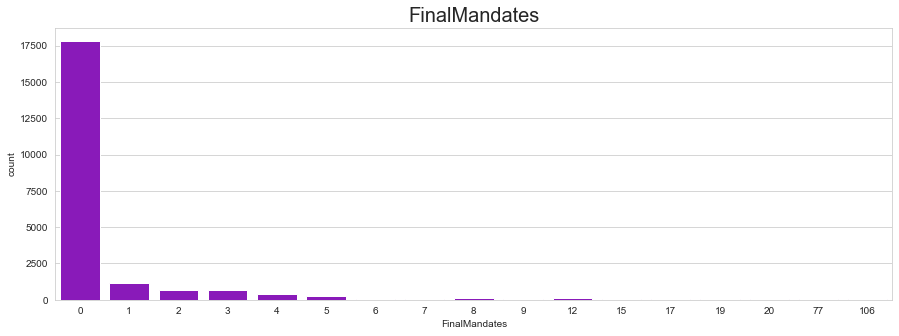

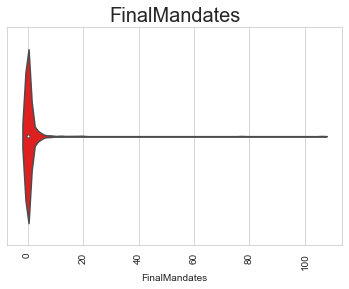

In [49]:
plot("FinalMandates")

# Baivariate Analysis

In [50]:
#lets make a function for countplot
def plot3(p):
    sns.set_style("whitegrid")
    plt.figure(figsize=[15,5])
    sns.barplot(x=p,y='FinalMandates',data=df_elc)
    plt.xlabel(p)
    plt.title(p,{"fontsize":20})
    plt.xticks(rotation=50)
    plt.show()

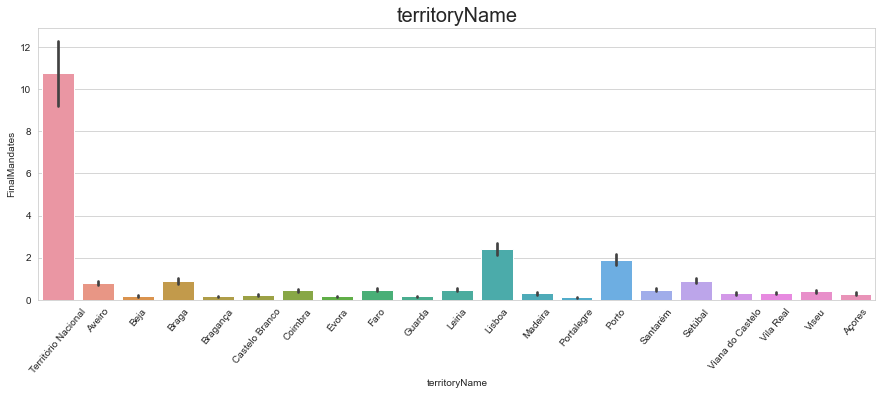

In [51]:
plot3("territoryName")

Observation:
     from Territorio nacional most of the mp's in a District  are   win the election.

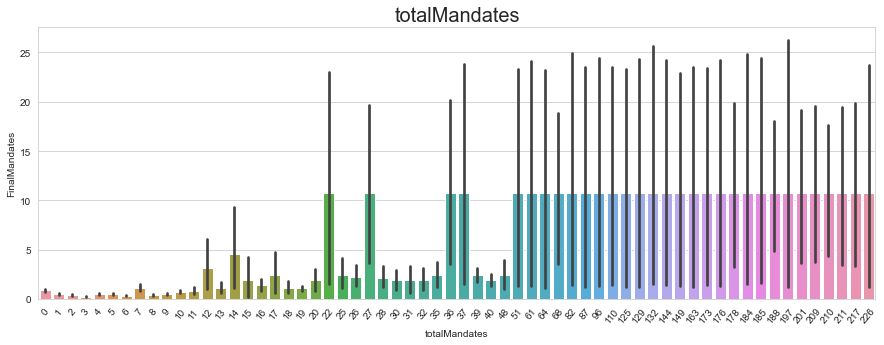

In [52]:
plot3("totalMandates")

Observation:
    
    When more than 50 MP's elected at the moment  the final number of elected MP's is constant on 11.

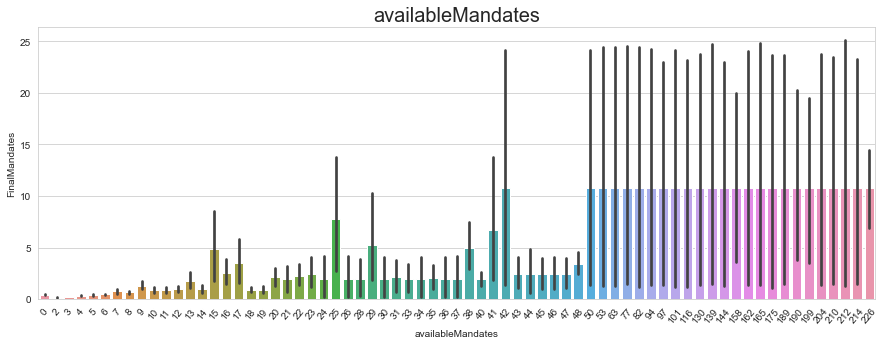

In [53]:
plot3("availableMandates")

Observation:
    When more than 50 MP's left to elect at the moment the final number of elected MP's in a District  is constant on 11.

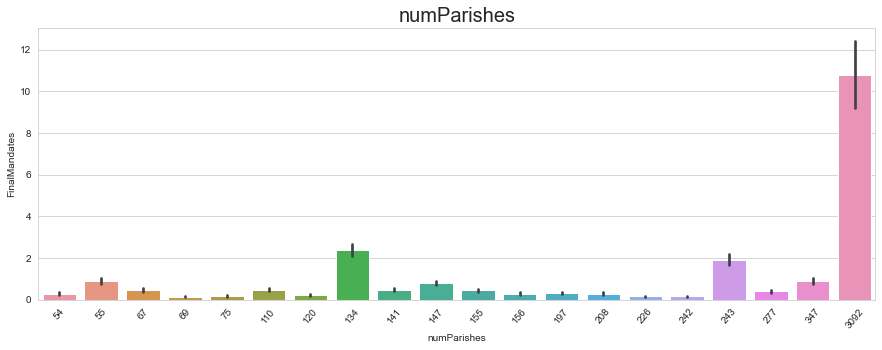

In [54]:
plot3("numParishes")

Observation:
    
    When Total number of parishes is high the final number of elected MP's  in a District is High.

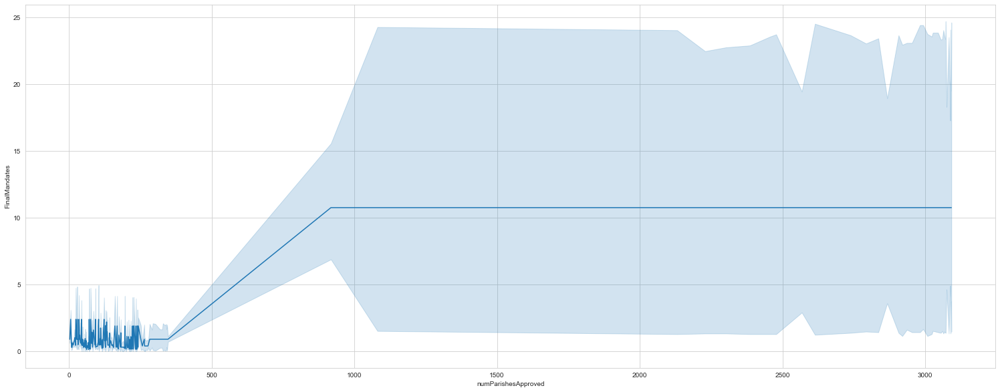

In [55]:
plt.figure(figsize=[26,10])
sns.lineplot(x="numParishesApproved",y="FinalMandates",data=df_elc)

Observation:
    
    When Number of parishes approved on the  location is more than 1000 the final number of elected MP's in a District  is constant.

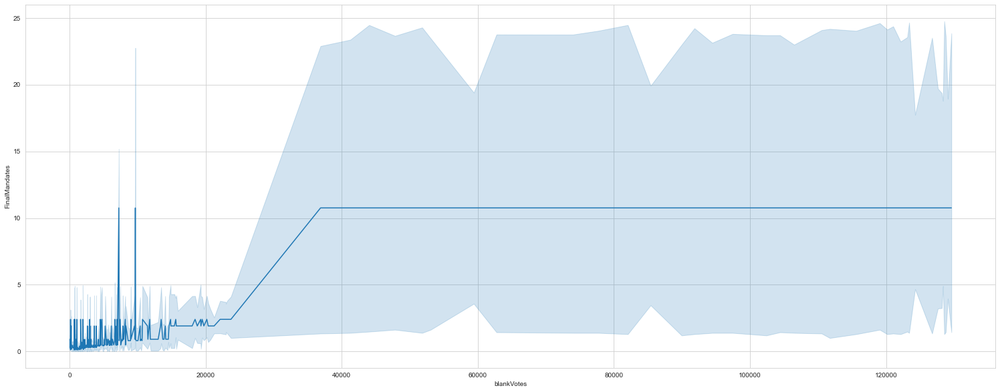

In [56]:

plt.figure(figsize=[26,10])
sns.lineplot(x="blankVotes",y="FinalMandates",data=df_elc)

Observation:

 When Number of blank votes is more than 21000 the final number of elected MP's in a District  is constant.


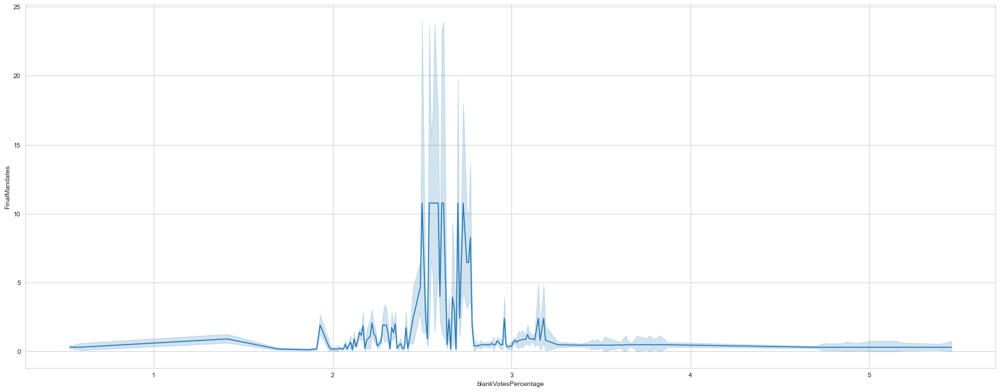

In [57]:
plt.figure(figsize=[26,10])
sns.lineplot(x="blankVotesPercentage",y="FinalMandates",data=df_elc)

Observation:

When Percentage of blank votes is between 2.5 to 2.8 then  final number of elected MP's in a District  is High.

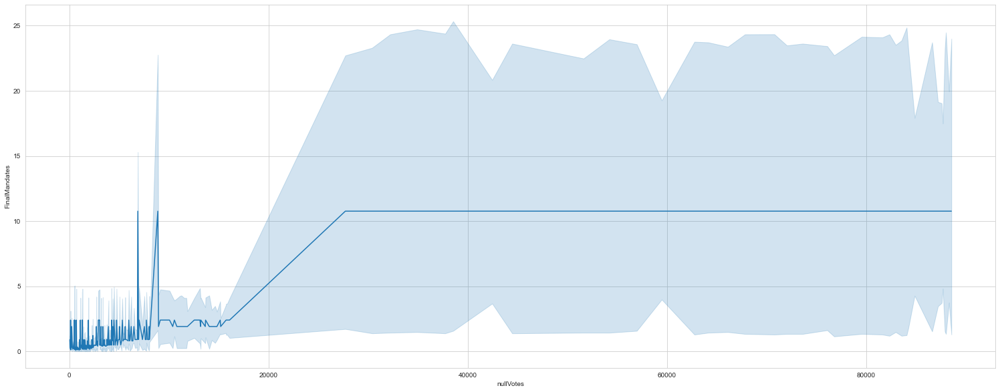

In [58]:
plt.figure(figsize=[26,10])
sns.lineplot(x="nullVotes",y="FinalMandates",data=df_elc)

Observation:

When Number of null votes is more than 26000 the final number of elected MP's in a District  is constant.

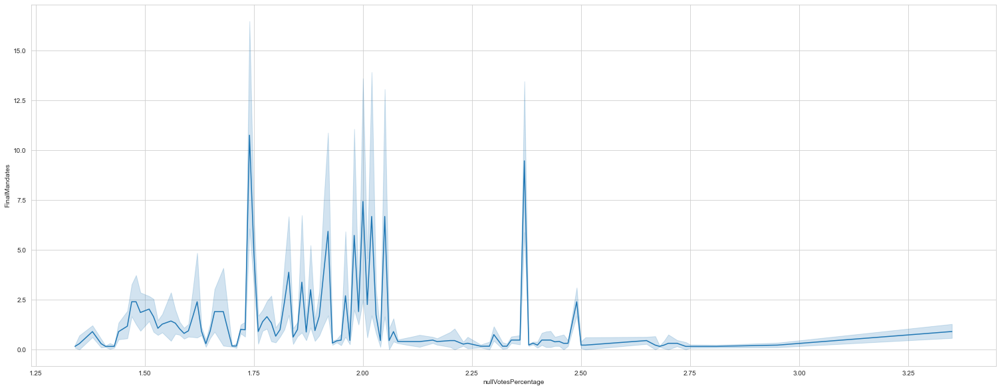

In [59]:
plt.figure(figsize=[26,10])
sns.lineplot(x="nullVotesPercentage",y="FinalMandates",data=df_elc)

Observation:

When Number of null votes  percentage is 1.75  the final number of elected MP's in a District  is high.



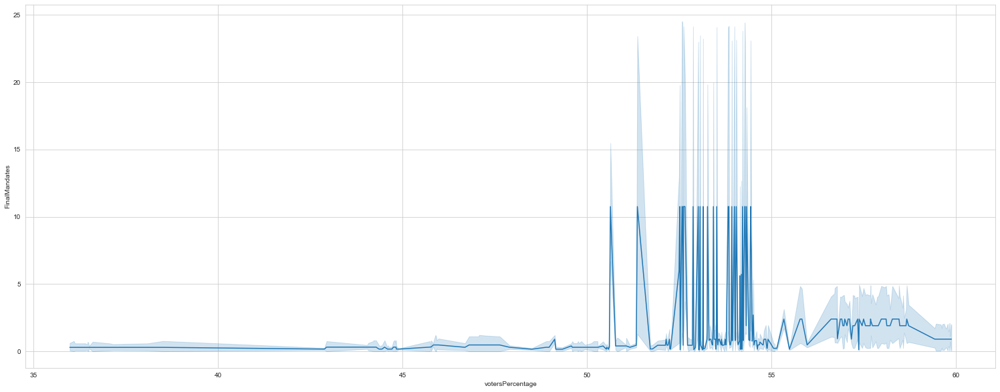

In [60]:
plt.figure(figsize=[26,10])
sns.lineplot(x="votersPercentage",y="FinalMandates",data=df_elc)

Observation:

When Percentage of voters is between 50 to 55 then  the final number of elected MP's in a District is high.



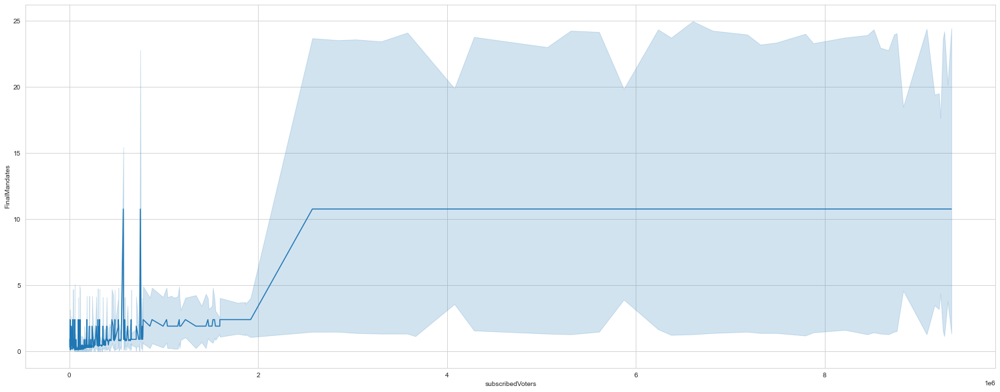

In [61]:
plt.figure(figsize=[26,10])
sns.lineplot(x="subscribedVoters",y="FinalMandates",data=df_elc)

Observation:

When Number of subscribed voters in the location is more than 3 the final number of elected MP's in a District  is constant.

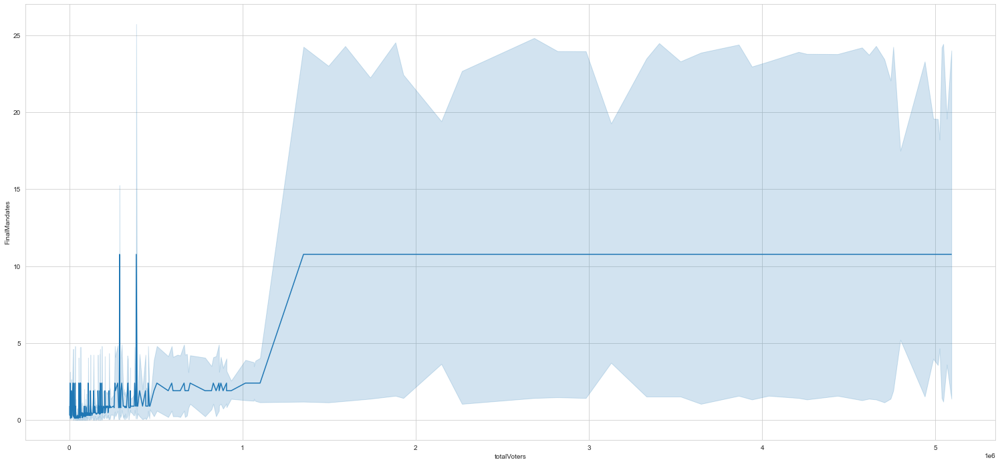

In [62]:
plt.figure(figsize=[26,12])
sns.lineplot(x="totalVoters",y="FinalMandates",data=df_elc)

Observation:

When Percentage of blank votes is more than 1.5 the final number of elected MP's in a District  no is constant.

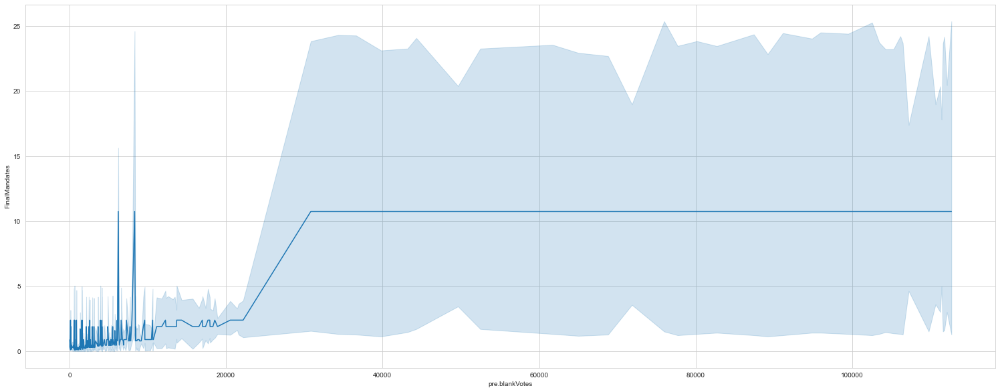

In [63]:
plt.figure(figsize=[26,10])
sns.lineplot(x="pre.blankVotes",y="FinalMandates",data=df_elc)

Observation:

When the previous elections number of blank votes is more than 30000,
 then in the current Election final number of elected MP's  in a District is constant in 10

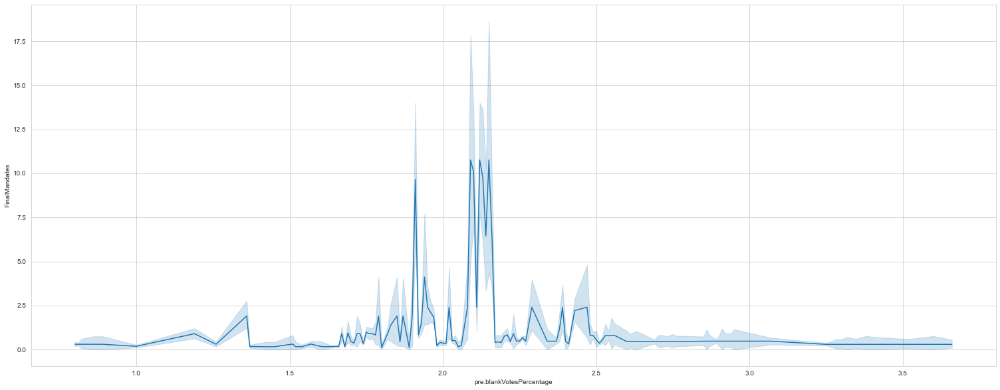

In [64]:
plt.figure(figsize=[26,10])
sns.lineplot(x="pre.blankVotesPercentage",y="FinalMandates",data=df_elc)

Observation:

When the previous elections number of blank votes percentages  is between 2.1 to 2.3, then in the current Election final number of elected MP's in a District  is constant in 10

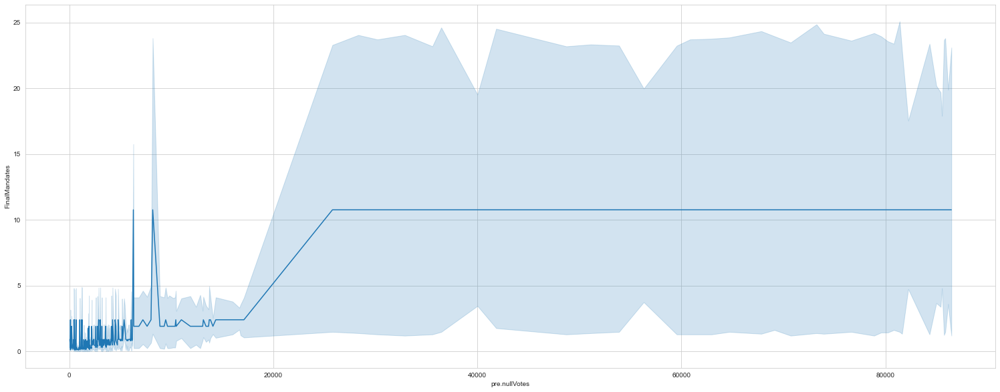

In [65]:
plt.figure(figsize=[26,10])
sns.lineplot(x="pre.nullVotes",y="FinalMandates",data=df_elc)

Observation:

When the previous elections number of null  votes is more than 25000, then in the current Election final number of elected MP's in a District  is constant in 10


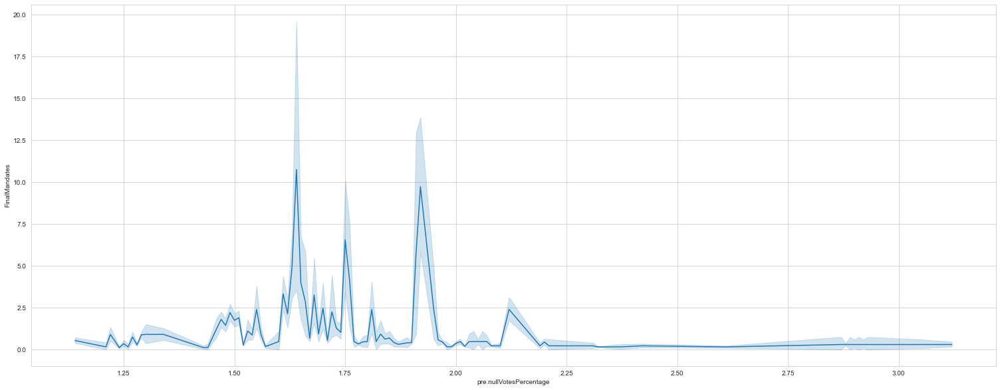

In [66]:
plt.figure(figsize=[26,10])
sns.lineplot(x="pre.nullVotesPercentage",y="FinalMandates",data=df_elc)

Observation:

When the previous elections number of null votes percentages is between 1.60 to 1.90, then in the current Election final number of elected MP's  in a District is Incresing

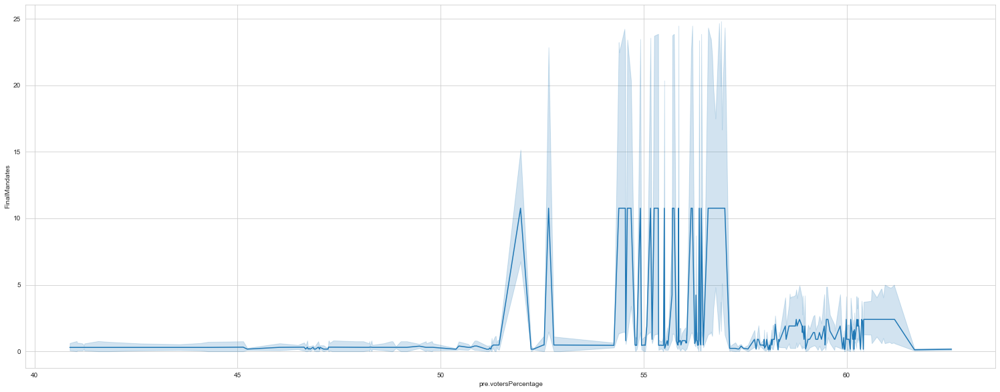

In [67]:
plt.figure(figsize=[26,10])
sns.lineplot(x="pre.votersPercentage",y="FinalMandates",data=df_elc)

Observation:
    
    When the Previous Elections percentage of voters is more than 50 then The current elections the final number of elected MP's in a District  is incresing

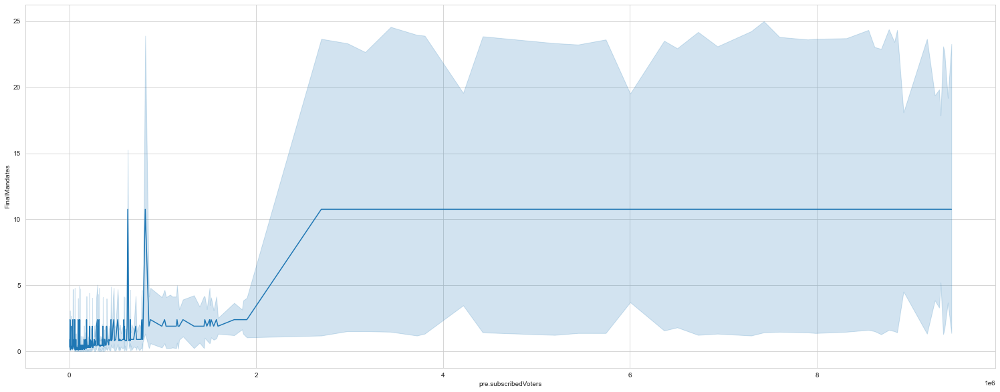

In [68]:
plt.figure(figsize=[26,10])
sns.lineplot(x="pre.subscribedVoters",y="FinalMandates",data=df_elc)

Observation:
    
    When the Number of subscribed voters in the location of previous election is 3 or more than 3 then ,current election final number of elected MP's in a District is constant in 10

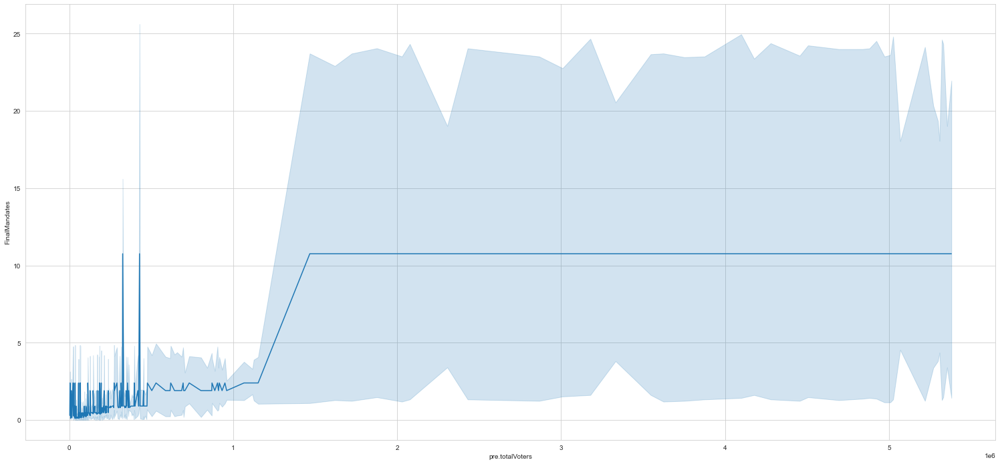

In [69]:
plt.figure(figsize=[26,12])
sns.lineplot(x="pre.totalVoters",y="FinalMandates",data=df_elc)

Observation:
    
    When the percentege of bank votes  in the location of previous election is more than 1.5 then ,current election final number of elected MP's in a District is constant in 10

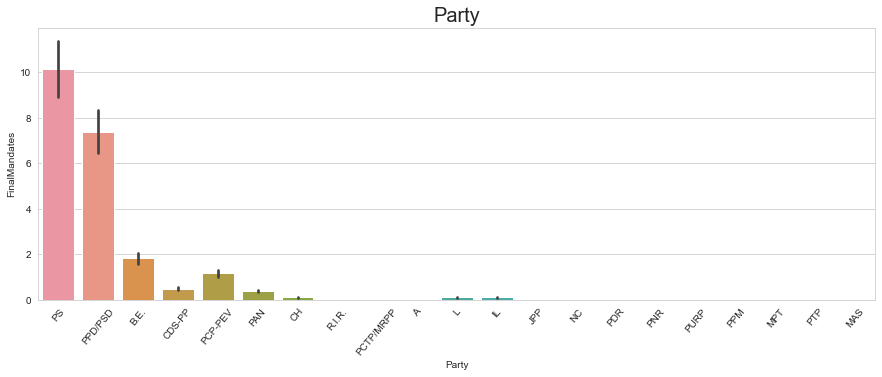

In [70]:
plot3("Party")

Obdervation:
    
   when the candidet is from PS political party,then final number of elected MP's in a district is high.

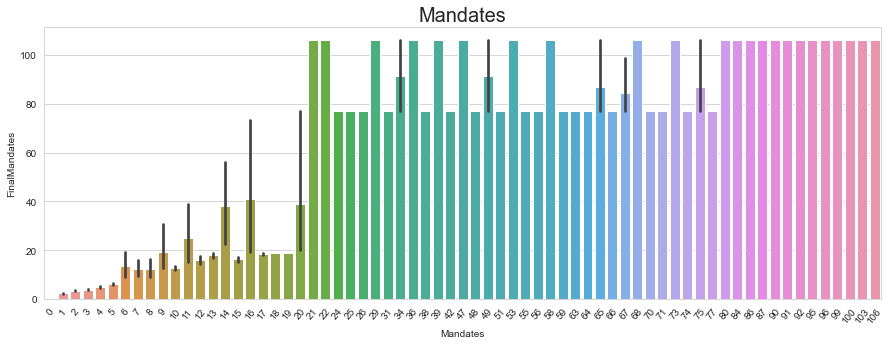

In [71]:
plot3("Mandates")

Observation :
    
    when MP's elected at the moment for the party in a given district is more than 80,then final number of elected MP's in a district is 100

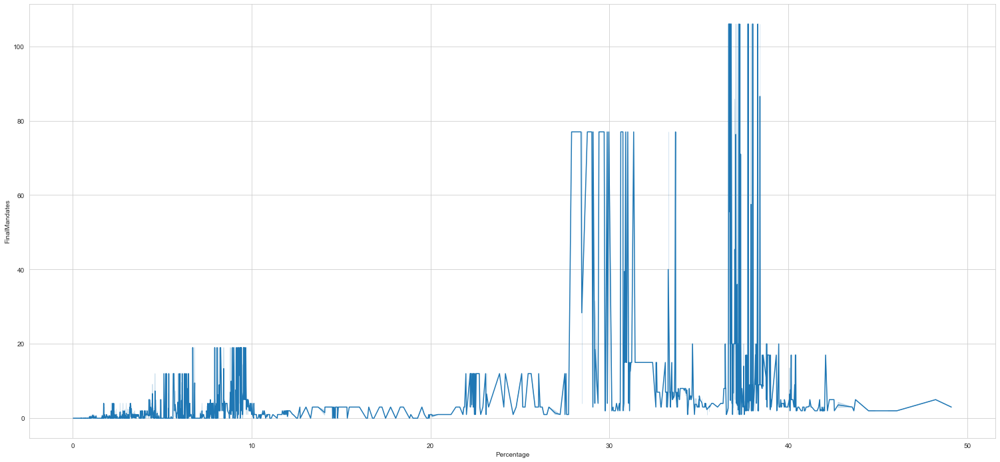

In [72]:
plt.figure(figsize=[26,12])
sns.lineplot(x="Percentage",y="FinalMandates",data=df_elc)

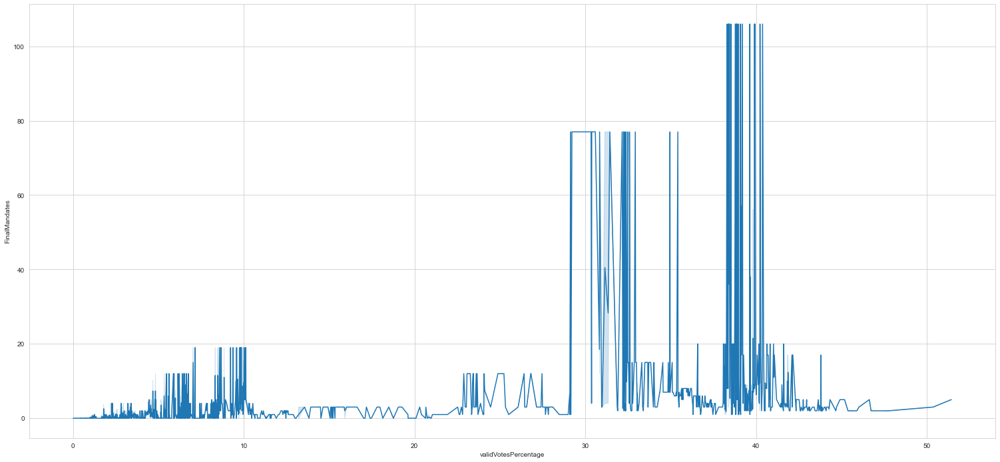

In [73]:
plt.figure(figsize=[26,12])
sns.lineplot(x="validVotesPercentage",y="FinalMandates",data=df_elc)

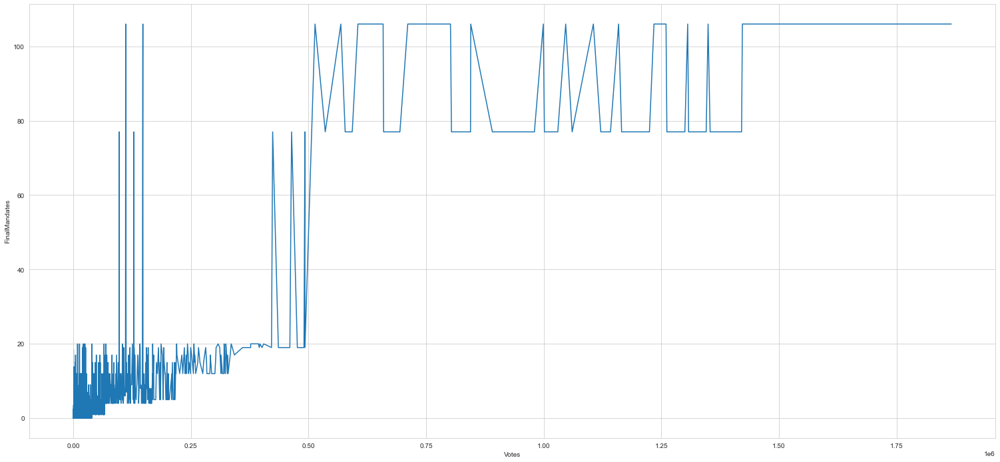

In [74]:
plt.figure(figsize=[26,12])
sns.lineplot(x="Votes",y="FinalMandates",data=df_elc)

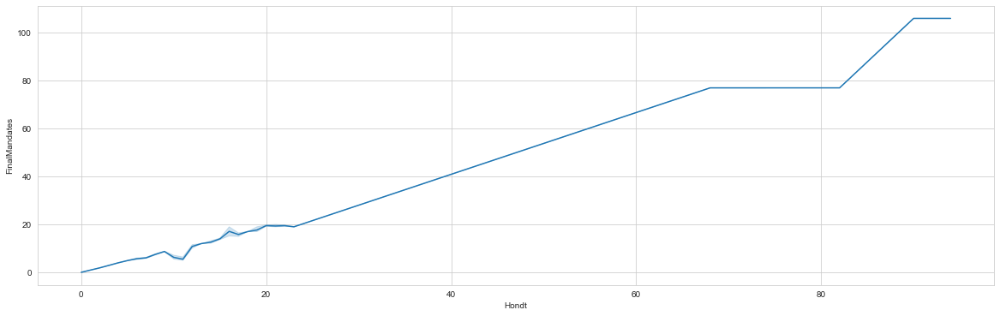

In [75]:
plt.figure(figsize=[20,6])
sns.lineplot(x="Hondt",y="FinalMandates",data=df_elc)

Observation:
    when Number of MP's according to the distribution of votes is incresing the same time final number of elected MP's in a district also incresing.

In [76]:
sns.pairplot(df_elc,hue='FinalMandates',size=6)

# Handelling the categorical data

In [77]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
g=df_elc.columns
for i in g:
    if df_elc[i].dtypes=="object":
        df_elc[i]=l.fit_transform(df_elc[i])
df_elc.dtypes

territoryName                 int32
totalMandates                 int64
availableMandates             int64
numParishes                   int64
numParishesApproved           int64
blankVotes                    int64
blankVotesPercentage        float64
nullVotes                     int64
nullVotesPercentage         float64
votersPercentage            float64
subscribedVoters              int64
totalVoters                   int64
pre.blankVotes                int64
pre.blankVotesPercentage    float64
pre.nullVotes                 int64
pre.nullVotesPercentage     float64
pre.votersPercentage        float64
pre.subscribedVoters          int64
pre.totalVoters               int64
Party                         int32
Mandates                      int64
Percentage                  float64
validVotesPercentage        float64
Votes                         int64
Hondt                         int64
FinalMandates                 int64
dtype: object

In [78]:
#removing outliers with zscore
from scipy.stats import zscore
z=np.abs(zscore(df_elc))
print(np.where(z>3))

(array([    0,     0,     0, ..., 21608, 21623, 21623], dtype=int64), array([ 2,  3, 21, ..., 22, 21, 22], dtype=int64))


In [79]:
df_elc_f=df_elc[(z<3).all(axis=1)]
print(df_elc.shape,'\n',df_elc_f.shape)

(21643, 26) 
 (18333, 26)


In [80]:
#spliting the input and output variable 
df_x=df_elc_f.drop(columns='FinalMandates')
y=df_elc_f[['FinalMandates']]

print(df_x.shape,'\n',y.shape)

(18333, 25) 
 (18333, 1)


# FEATURE_SELECTION→

In [81]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(df_x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(df_x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Features','Score']  #naming the dataframe columns

In [82]:
featureScores

,Features,Score
0,territoryName,1.768954e+03
1,totalMandates,8.200560e+03
2,availableMandates,3.116412e+04
3,numParishes,1.990871e+04
4,numParishesApproved,2.220962e+04
5,blankVotes,6.378177e+06
6,blankVotesPercentage,3.221479e+01
7,nullVotes,3.715976e+06
8,nullVotesPercentage,2.518026e+01
9,votersPercentage,3.120761e+02


In [83]:
#taking df_x_f for training
#Stamdardize the data
from sklearn.preprocessing import StandardScaler
dc=StandardScaler()
x=dc.fit_transform(df_x)
x=pd.DataFrame(x,columns=df_x.columns)

In [84]:
x

,territoryName,totalMandates,availableMandates,numParishes,numParishesApproved,blankVotes,blankVotesPercentage,nullVotes,nullVotesPercentage,votersPercentage,...,pre.nullVotesPercentage,pre.votersPercentage,pre.subscribedVoters,pre.totalVoters,Party,Mandates,Percentage,validVotesPercentage,Votes,Hondt
0,-1.741356,-0.767282,0.979379,-0.099227,-1.394293,-0.875510,0.540356,-0.950770,-1.044112,0.185510,...,-0.375814,-0.133418,-0.900191,-0.845089,1.177919,-0.206043,4.612609,4.603604,-0.190208,4.560088
1,-1.741356,-0.767282,0.979379,-0.099227,-1.394293,-0.875510,0.540356,-0.950770,-1.044112,0.185510,...,-0.375814,-0.133418,-0.900191,-0.845089,-1.435236,-0.206043,0.644624,0.642757,-0.282371,0.445033
2,-1.741356,-0.767282,0.979379,-0.099227,-1.394293,-0.875510,0.540356,-0.950770,-1.044112,0.185510,...,-0.375814,-0.133418,-0.900191,-0.845089,-1.271914,-0.206043,0.448145,0.447038,-0.286949,0.445033
3,-1.741356,-0.767282,0.979379,-0.099227,-1.394293,-0.875510,0.540356,-0.950770,-1.044112,0.185510,...,-0.375814,-0.133418,-0.900191,-0.845089,0.197986,-0.206043,-0.105837,-0.106326,-0.299823,-0.240810
4,-1.741356,-0.767282,0.979379,-0.099227,-1.394293,-0.875510,0.540356,-0.950770,-1.044112,0.185510,...,-0.375814,-0.133418,-0.900191,-0.845089,0.034664,-0.206043,-0.157542,-0.157016,-0.301008,-0.240810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18328,1.508735,0.229491,-0.590067,1.489023,1.671709,0.057648,0.376728,0.124119,0.312437,-0.389621,...,0.326796,-0.884032,0.094377,-0.005666,-0.128659,-0.206043,-0.430839,-0.430178,-0.290127,-0.240810
18329,1.508735,0.229491,-0.590067,1.489023,1.671709,0.057648,0.376728,0.124119,0.312437,-0.389621,...,0.326796,-0.884032,0.094377,-0.005666,0.687952,-0.206043,-0.432317,-0.431586,-0.290450,-0.240810
18330,1.508735,0.229491,-0.590067,1.489023,1.671709,0.057648,0.376728,0.124119,0.312437,-0.389621,...,0.326796,-0.884032,0.094377,-0.005666,-0.291981,-0.206043,-0.438226,-0.437218,-0.294221,-0.240810
18331,1.508735,0.229491,-0.590067,1.489023,1.671709,0.057648,0.376728,0.124119,0.312437,-0.389621,...,0.326796,-0.884032,0.094377,-0.005666,1.341241,-0.206043,-0.439703,-0.438626,-0.295136,-0.240810


# Model Creation

In [85]:
#In this data set we know that out target variable COST is continuous so we are going to take Regressor Algorithms
#lets make a function for getting the best random_satae for a model toget better accuracy(r2_score)
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
def election(rgr,x,y):
    max_acc=0
    for vote in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=vote,test_size=0.20)
        rgr.fit(x_train,y_train)
        prd=rgr.predict(x_test)
        acc=r2_score(y_test,prd)
        if acc>max_acc:
            max_acc=acc
            final_rd=vote
        
    print("max r2 score coresponding to ",final_rd,"♫is♫",max_acc*100)
    print("Mean_Squared_Error is: ",mean_squared_error(y_test,prd))
    print("Mean_Absolute_Error is: ",mean_absolute_error(y_test,prd))
    print("RMSE is →",np.sqrt(mean_squared_error(y_test,prd)))
    return final_rd

In [86]:
#importing the linear regresson
from sklearn.linear_model import LinearRegression
lnr=LinearRegression()
election(lnr,x,y)

max r2 score coresponding to  47 ♫is♫ 99.05664618996641
Mean_Squared_Error is:  0.028640517853351852
Mean_Absolute_Error is:  0.04841920472291327
RMSE is → 0.1692350963995112


47

In [92]:
#lets make a function for cross_val_score
from sklearn.model_selection import cross_val_score   
def k(model,x,y):
    c=cross_val_score(model,x,y,cv=5,scoring="r2")
    print("mean r2 score for ",model,c.mean())
    print("Standard deviation  in r2 score for ",model,c.std())
    print()
    print("******************************************************")


In [88]:
k(lnr,x,y)

mean r2 score for  LinearRegression() 0.9881708748738174
Standard deviation  in r2 score for  LinearRegression() 0.014321402756341283

******************************************************


In [89]:
from sklearn.neighbors import KNeighborsRegressor
for i in range(1,50,2):
    k=KNeighborsRegressor(n_neighbors=i)
    election(k,x,y)
    print(i)
    print("☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻")

max r2 score coresponding to  83 ♫is♫ 99.98854210808088
Mean_Squared_Error is:  0.0013635124079629125
Mean_Absolute_Error is:  0.0013635124079629125
RMSE is → 0.036925768887904185
1
☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻
max r2 score coresponding to  89 ♫is♫ 99.93057376196512
Mean_Squared_Error is:  0.0037875344665636457
Mean_Absolute_Error is:  0.005544950459049177
RMSE is → 0.06154294814650697
3
☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻
max r2 score coresponding to  45 ♫is♫ 99.85804985173513
Mean_Squared_Error is:  0.005214071448050177
Mean_Absolute_Error is:  0.00872647941096264
RMSE is → 0.0722085275299959
5
☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻
max r2 score coresponding to  97 ♫is♫ 99.74863370868174
Mean_Squared_Error is:  0.006784169899211389
Mean_Absolute_Error is:  0.012037866687443997
RMSE is → 0.08236607250082639
7
☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻☻
max r2 score coresponding to  44 ♫is♫ 99.51933415997928
Mean_Squared_Error is:  0.011113467799223642
Mean_Absolute_Error is:  

In [93]:
kn=KNeighborsRegressor(n_neighbors=3)
k(kn,x,y)


mean r2 score for  KNeighborsRegressor(n_neighbors=3) 0.97938228130491
Standard deviation  in r2 score for  KNeighborsRegressor(n_neighbors=3) 0.027824352357861987

******************************************************


In [94]:
#after seen the above results  i am going to finalise my model with LinearRegression()
#with the random sate of 47 
lnr=LinearRegression()
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=47,test_size=0.20)
lnr.fit(x_train,y_train)
prd=lnr.predict(x_test)
accuracy=r2_score(y_test,prd)
print("accuracy",accuracy*100)
print('\n')
print('\n')
print("Mean_Squared_Error is: ",mean_squared_error(y_test,prd))
print('\n')
print("Mean_Absolute_Error is: ",mean_absolute_error(y_test,prd))
print('\n')
print("RMSE is →",np.sqrt(mean_squared_error(y_test,prd)))

accuracy 99.05664618996641




Mean_Squared_Error is:  0.024332825040662292


Mean_Absolute_Error is:  0.0508598603509659


RMSE is → 0.15598982351635088


In [95]:
import joblib #importing the job
  
# Save the model as a pickle in a file 
joblib.dump(lnr,'Election.pkl')

['Election.pkl']

In [96]:
#saving the predict as csv
joblib.dump(lnr,'Election.csv')

['Election.csv']

In [97]:
#lets call the model and predict it
model=joblib.load('Election.csv')
model.predict(x_test)

array([[ 0.05348262],
       [ 0.08545206],
       [-0.01639445],
       ...,
       [-0.01319275],
       [ 0.04115871],
       [ 0.00754855]])